## CUSTOMER BEHAVIOUR ANALYSIS CAPSTONE PROJECT

### This project aims to analyse the relationship between price and purchasing probability across various social sections using logistic regression. Leveraging data on prices of 5 brands and responses from 4 social sections, the goal is to predict how the probability of buying a product decreases with increasing prices, facilitating informed marketing strategies.

## Libraries

In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import scipy

#These are the visualization libraries. Matplotlib is standard and is what most people use.
#Seaborn works on top of matplotlib, as we mentioned in the course.
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

import warnings
warnings.filterwarnings('ignore')

#For standardizing features. We'll use the StandardScaler module.
from sklearn.preprocessing import StandardScaler
#Hierarchical clustering with the Sci Py library. We'll use the dendrogram and linkage modules.
from scipy.cluster.hierarchy import dendrogram, linkage
#Sk learn is one of the most widely used libraries for machine learning. We'll use the k means and pca modules.
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
# We need to save the models, we import pickle in order to be able to load our pickled objects.
import pickle

from sklearn.linear_model import LogisticRegression 
from sklearn.linear_model import LinearRegression

# import tensorflow as tf

## Part 1 - Customer Segmentation

#### Import Data

In [2]:
# Load the data, contained in the segmentation data csv file.
df_segmentation = pd.read_csv('segmentation data.csv', index_col = 0)

#### Explore Data

In [3]:
df_segmentation.head()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
ID,,,,,,,
100000001,0,0,67,2,124670,1,2
100000002,1,1,22,1,150773,1,2
100000003,0,0,49,1,89210,0,0
100000004,0,0,45,1,171565,1,1
100000005,0,0,53,1,149031,1,1


In [ ]:
df_segmentation.info()

In [4]:
# Descriptive analysis of the data set. Here we just look at the data to gain some insight. 
# We do not apply any transformations or changes to the data.
df_segmentation.describe()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
count,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000
mean,0.457000,0.496500,35.909000,1.03800,120954.419000,0.810500,0.739000
std,0.498272,0.500113,11.719402,0.59978,38108.824679,0.638587,0.812533
min,0.000000,0.000000,18.000000,0.00000,35832.000000,0.000000,0.000000
25%,0.000000,0.000000,27.000000,1.00000,97663.250000,0.000000,0.000000
50%,0.000000,0.000000,33.000000,1.00000,115548.500000,1.000000,1.000000
75%,1.000000,1.000000,42.000000,1.00000,138072.250000,1.000000,1.000000
max,1.000000,1.000000,76.000000,3.00000,309364.000000,2.000000,2.000000


#### Correlation Estimation

In [5]:
# Compute Pearson correlation coefficient for the features in our data set.
# The correlation method in pandas, it has the Pearson correlation set as default.
df_segmentation.corr()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
Sex,1.000000,0.566511,-0.182885,0.244838,-0.195146,-0.202491,-0.300803
Marital status,0.566511,1.000000,-0.213178,0.374017,-0.073528,-0.029490,-0.097041
Age,-0.182885,-0.213178,1.000000,0.654605,0.340610,0.108388,0.119751
Education,0.244838,0.374017,0.654605,1.000000,0.233459,0.064524,0.034732
Income,-0.195146,-0.073528,0.340610,0.233459,1.000000,0.680357,0.490881
Occupation,-0.202491,-0.029490,0.108388,0.064524,0.680357,1.000000,0.571795
Settlement size,-0.300803,-0.097041,0.119751,0.034732,0.490881,0.571795,1.000000


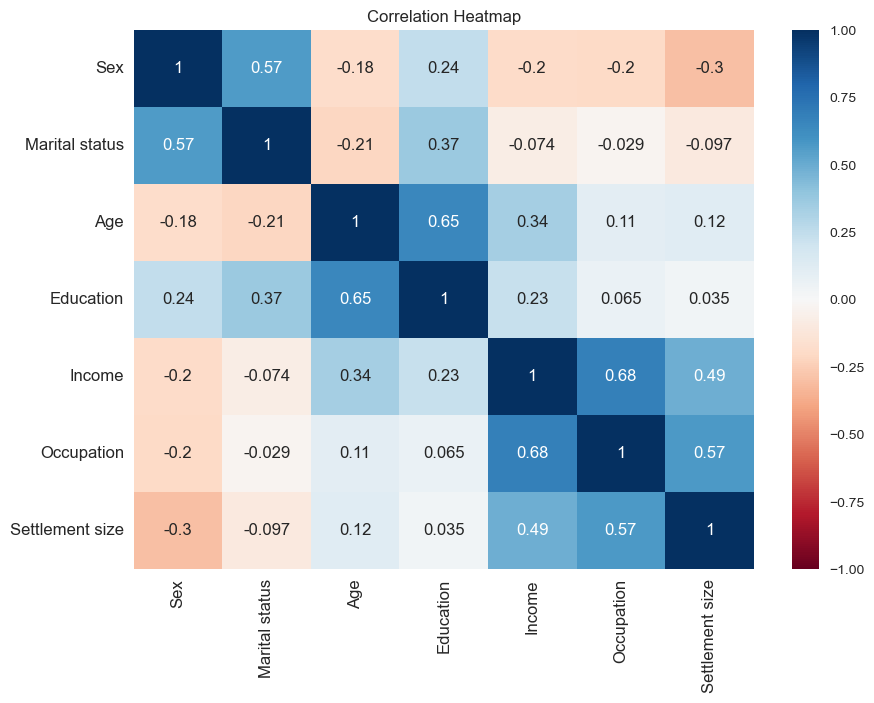

In [6]:
# We'll plot the correlations using a Heat Map. Heat Maps are a great way to visualize correlations using color coding.
# We use RdBu as a color scheme, but you can use viridis, Blues, YlGnBu or many others.
# We set the range from -1 to 1, as it is the range of the Pearson Correlation. 
# Otherwise the function infers the boundaries from the input.
# In this case they will be -0,25 to 0,68, as they are the minumum and maximum correlation indeces between our features.
plt.figure(figsize = (10, 7))
s = sns.heatmap(df_segmentation.corr(),
               annot = True, 
               cmap = 'RdBu',
               vmin = -1, 
               vmax = 1)
s.set_yticklabels(s.get_yticklabels(), rotation = 0, fontsize = 12)
s.set_xticklabels(s.get_xticklabels(), rotation = 90, fontsize = 12)
plt.title('Correlation Heatmap')
plt.show()

#### Visualize Data

Text(0.5, 1.0, 'Visualization of raw data')

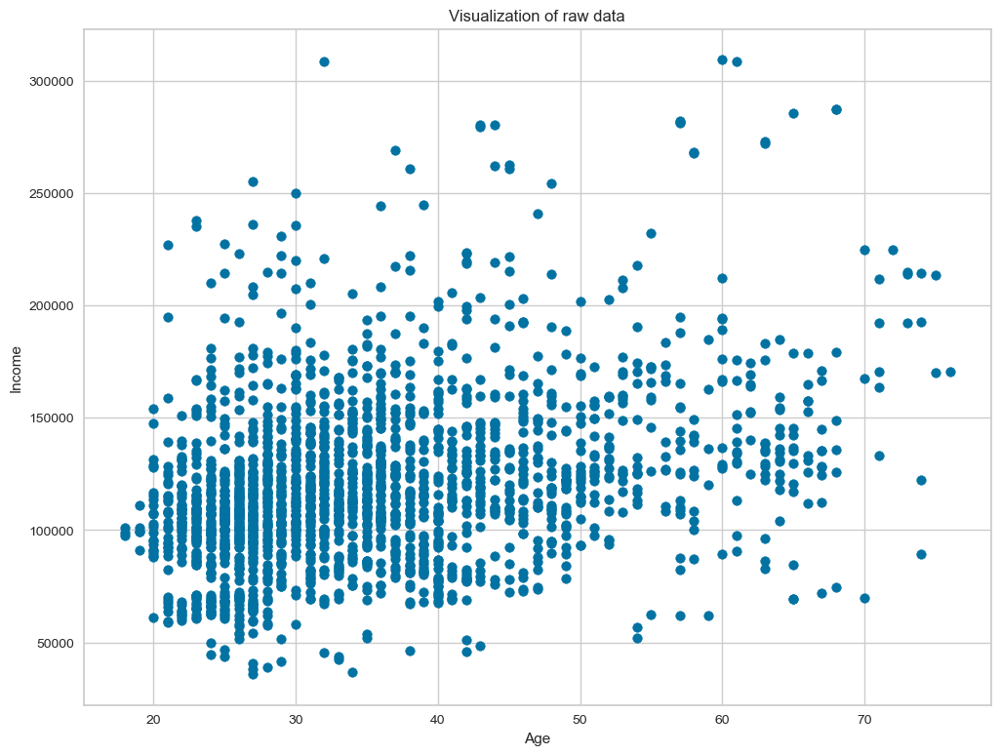

In [7]:
# We'll plot the data. We create a 12 by 9 inches figure.
# We have 2000 data points, which we'll scatter acrros Age and Income, located on positions 2 and 4 in our data set. 
plt.figure(figsize = (12, 9))
plt.scatter(df_segmentation.iloc[:, 2], df_segmentation.iloc[:, 4])
plt.xlabel('Age')
plt.ylabel('Income')
plt.title('Visualization of raw data')

#### Standardization

In [8]:
# Standardizing data, so that all features have equal weight. This is important for modelling.
# Otherwise, in our case Income would be considered much more important than Education for Instance. 
# We do not know if this is the case, so we would not like to introduce it to our model. 
# This is what is also refered to as bias.
scaler = StandardScaler()
segmentation_std = scaler.fit_transform(df_segmentation)

In [9]:
segmentation_std

array([[-0.91739884, -0.99302433,  2.65361447, ...,  0.09752361,
         0.29682303,  1.552326  ],
       [ 1.09003844,  1.00702467, -1.18713209, ...,  0.78265438,
         0.29682303,  1.552326  ],
       [-0.91739884, -0.99302433,  1.11731585, ..., -0.83320224,
        -1.26952539, -0.90972951],
       ...,
       [-0.91739884, -0.99302433, -0.41898277, ..., -0.90695688,
        -1.26952539, -0.90972951],
       [ 1.09003844,  1.00702467, -1.01643224, ..., -0.60332923,
        -1.26952539, -0.90972951],
       [-0.91739884, -0.99302433, -0.93108232, ..., -1.3789866 ,
        -1.26952539, -0.90972951]])

#### Hierarchical Clustering

In [10]:
# Perform Hierarchical Clustering. The results are returned as a linkage matrix. 
hier_clust = linkage(segmentation_std, method = 'ward')

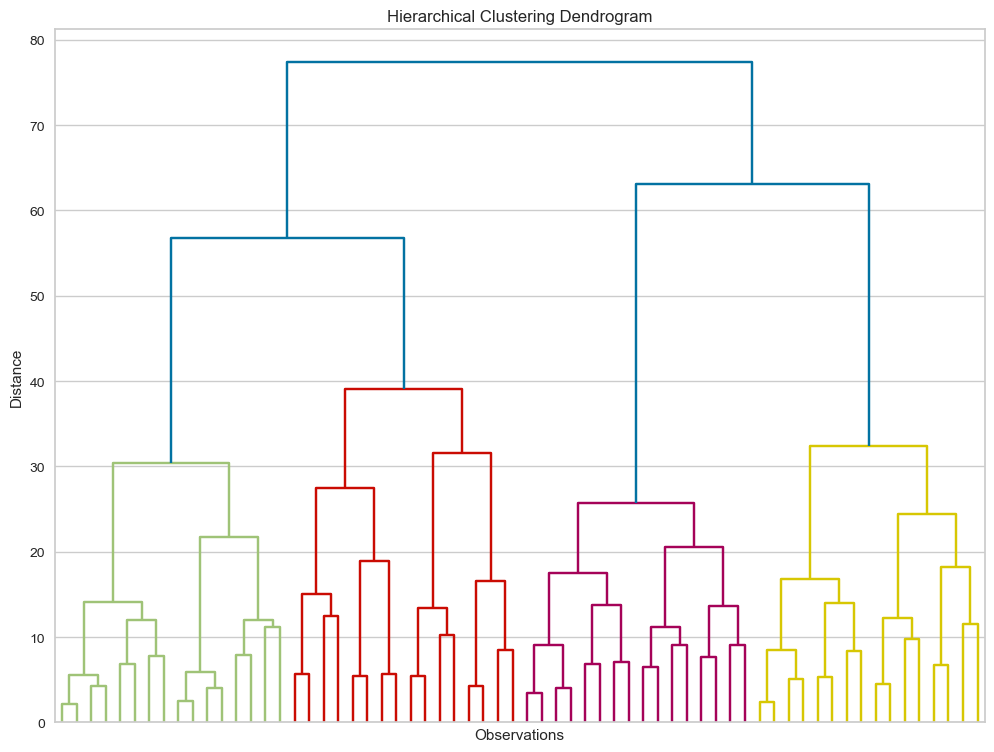

In [11]:
# We plot the results from the Hierarchical Clustering using a Dendrogram. 
# We truncate the dendrogram for better readability. The level p shows only the last p merged clusters
# We also omit showing the labels for each point.
plt.figure(figsize = (12,9))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Observations')
plt.ylabel('Distance')
dendrogram(hier_clust,
           truncate_mode = 'level', 
           p = 5, 
           show_leaf_counts = False, 
           no_labels = True)
plt.show()

#### K Means Clustering

In [12]:
# Perform K-means clustering. We consider 1 to 10 clusters, so our for loop runs 10 iterations.
# In addition we run the algortihm at many different starting points - k means plus plus. 
# And we set a random state for reproducibility.
wcss = []
for i in range(1,11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(segmentation_std)
    wcss.append(kmeans.inertia_)

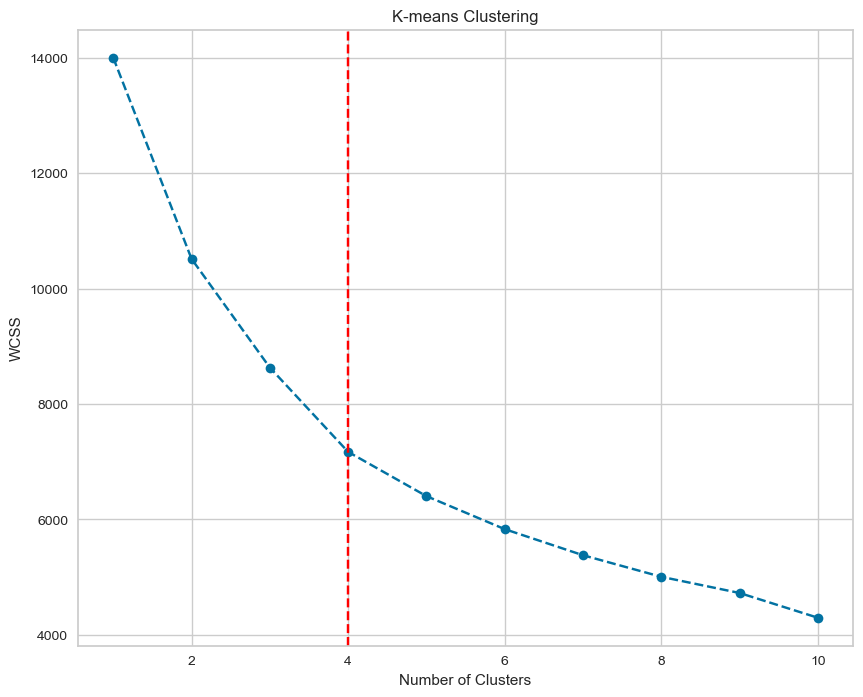

In [13]:
# Plot the Within Cluster Sum of Squares for the different number of clusters.
# From this plot we choose the number of clusters. 
# We look for a kink in the graphic, after which the descent of wcss isn't as pronounced.
plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '--')
plt.axvline(x=4,color='red',ls='--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.show()

#### k elbow

In [14]:
k_elbow = KElbowVisualizer(KMeans(), k=10)

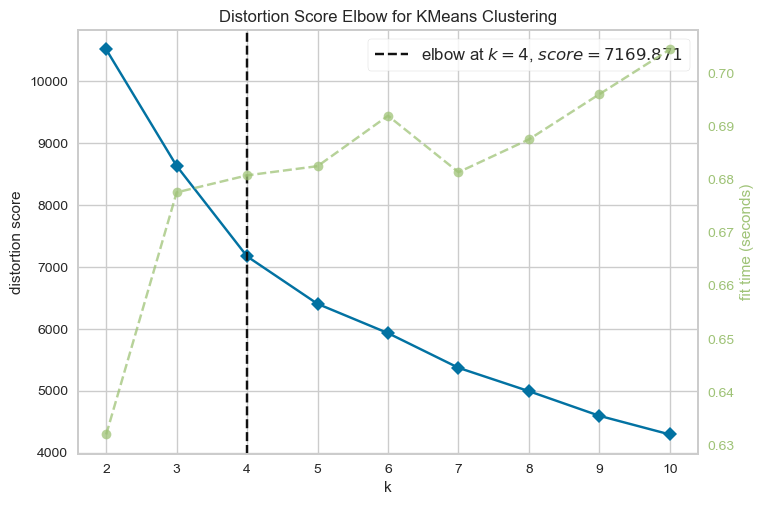

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [15]:
k_elbow.fit(segmentation_std)
k_elbow.show()

In [16]:
# We run K-means with a fixed number of clusters. In our case 4.
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)

In [17]:
# We divide our data into the four clusters.
kmeans.fit(segmentation_std)

KMeans(n_clusters=4, random_state=42)

#### Result

In [18]:
# We create a new data frame with the original features and add a new column with the assigned clusters for each point.
df_segm_kmeans = df_segmentation.copy()
df_segm_kmeans['Segment K-means'] = kmeans.labels_

In [19]:
# Calculate mean values for the clusters
df_segm_analysis = df_segm_kmeans.groupby(['Segment K-means']).mean()
df_segm_analysis

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
Segment K-means,,,,,,,
0,0.501901,0.692015,55.703422,2.129278,158338.422053,1.129278,1.110266
1,0.352814,0.019481,35.577922,0.746753,97859.852814,0.329004,0.043290
2,0.853901,0.997163,28.963121,1.068085,105759.119149,0.634043,0.422695
3,0.029825,0.173684,35.635088,0.733333,141218.249123,1.271930,1.522807


In [20]:
# Compute the size and proportions of the four clusters
df_segm_analysis['N Obs'] = df_segm_kmeans[['Segment K-means','Sex']].groupby(['Segment K-means']).count()
df_segm_analysis['Prop Obs'] = df_segm_analysis['N Obs'] / df_segm_analysis['N Obs'].sum()

In [21]:
df_segm_analysis

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,N Obs,Prop Obs
Segment K-means,,,,,,,,,
0,0.501901,0.692015,55.703422,2.129278,158338.422053,1.129278,1.110266,263,0.1315
1,0.352814,0.019481,35.577922,0.746753,97859.852814,0.329004,0.043290,462,0.2310
2,0.853901,0.997163,28.963121,1.068085,105759.119149,0.634043,0.422695,705,0.3525
3,0.029825,0.173684,35.635088,0.733333,141218.249123,1.271930,1.522807,570,0.2850


In [22]:
df_segm_analysis.rename({0:'Prosperous segment',
                         1:'Marginalized segment',
                         2:'Ordinary segment',
                         3:'Ambitious clientele'})

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,N Obs,Prop Obs
Segment K-means,,,,,,,,,
Prosperous segment,0.501901,0.692015,55.703422,2.129278,158338.422053,1.129278,1.110266,263,0.1315
Marginalized segment,0.352814,0.019481,35.577922,0.746753,97859.852814,0.329004,0.043290,462,0.2310
Ordinary segment,0.853901,0.997163,28.963121,1.068085,105759.119149,0.634043,0.422695,705,0.3525
Ambitious clientele,0.029825,0.173684,35.635088,0.733333,141218.249123,1.271930,1.522807,570,0.2850


In [23]:
# Add the segment labels to our table
df_segm_kmeans['Labels'] = df_segm_kmeans['Segment K-means'].map({0:'Prosperous segment', 
                                                                  1:'Marginalized segment',
                                                                  2:'Ordinary segment', 
                                                                  3:'Ambitious clientele'})

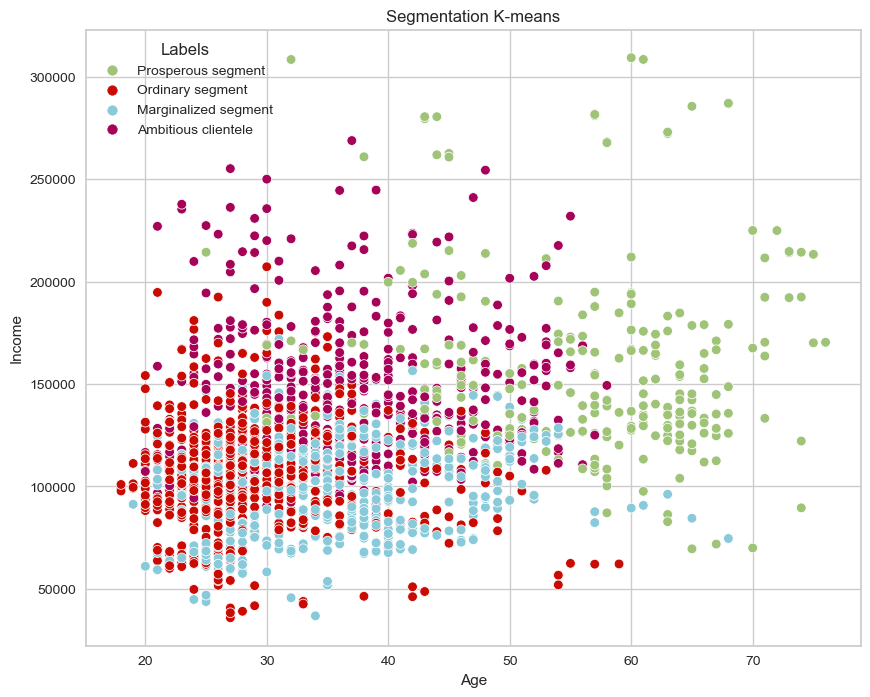

In [24]:
# We plot the results from the K-means algorithm. 
# Each point in our data set is plotted with the color of the clusters it has been assigned to.
x_axis = df_segm_kmeans['Age']
y_axis = df_segm_kmeans['Income']
plt.figure(figsize = (10, 8))
sns.scatterplot(x=x_axis, y=y_axis, hue = df_segm_kmeans['Labels'], palette = ['g', 'r', 'c', 'm'])
plt.title('Segmentation K-means')
plt.show()

#### PCA

In [25]:
# Employ PCA to find a subset of components, which explain the variance in the data.
pca = PCA()

In [26]:
# Fit PCA with our standardized data.
pca.fit(segmentation_std)

PCA()

In [27]:
# The attribute shows how much variance is explained by each of the seven individual components.
pca.explained_variance_ratio_

array([0.35696328, 0.26250923, 0.18821114, 0.0755775 , 0.05716512,
       0.03954794, 0.02002579])

Text(0, 0.5, 'Cumulative Explained Variance')

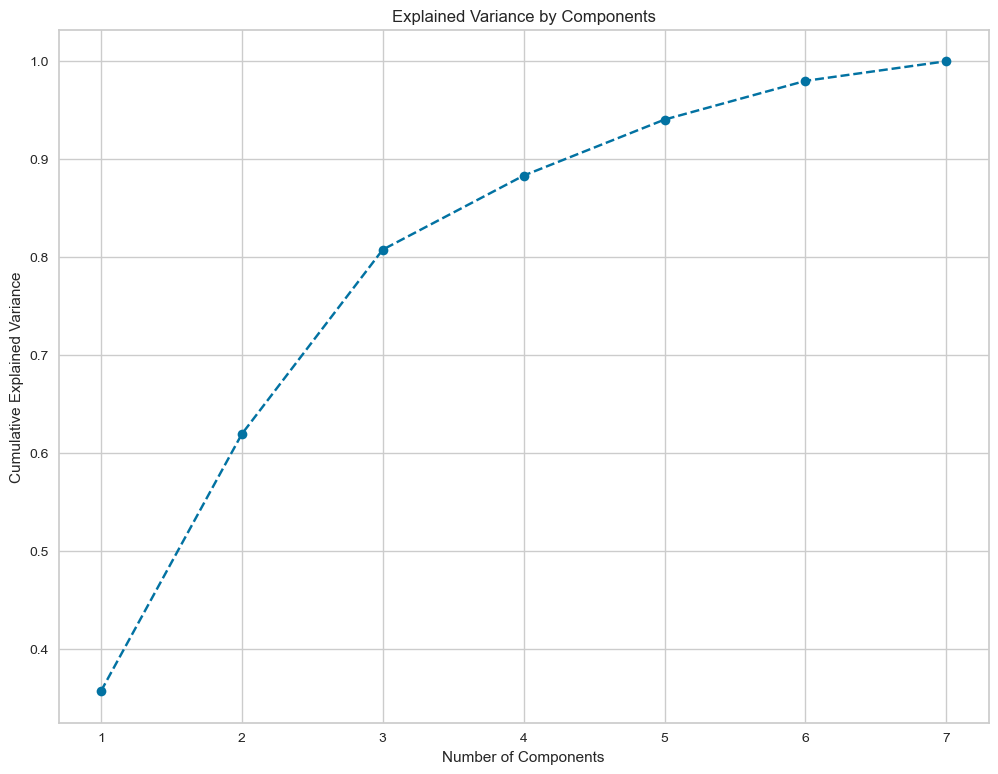

In [28]:
# Plot the cumulative variance explained by total number of components.
# On this graph we choose the subset of components we want to keep. 
# Generally, we want to keep around 80 % of the explained variance.
plt.figure(figsize = (12,9))
plt.plot(range(1,8), pca.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

In [29]:
# We choose three components. 3 or 4 seems the right choice according to the previous graph.
pca = PCA(n_components = 3)

In [30]:
#Fit the model the our data with the selected number of components. In our case three.
pca.fit(segmentation_std)

PCA(n_components=3)

#### PCA Results

In [31]:
# Here we discucss the results from the PCA.
# The components attribute shows the loadings of each component on each of the seven original features.
# The loadings are the correlations between the components and the original features. 
pca.components_

array([[-0.31469524, -0.19170439,  0.32609979,  0.15684089,  0.52452463,
         0.49205868,  0.46478852],
       [ 0.45800608,  0.51263492,  0.31220793,  0.63980683,  0.12468314,
         0.01465779, -0.06963165],
       [-0.29301261, -0.44197739,  0.60954372,  0.27560461, -0.16566231,
        -0.39550539, -0.29568503]])

In [32]:
df_pca_comp = pd.DataFrame(data = pca.components_,
                           columns = df_segmentation.columns.values,
                           index = ['Component 1', 'Component 2', 'Component 3'])
df_pca_comp

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
Component 1,-0.314695,-0.191704,0.326100,0.156841,0.524525,0.492059,0.464789
Component 2,0.458006,0.512635,0.312208,0.639807,0.124683,0.014658,-0.069632
Component 3,-0.293013,-0.441977,0.609544,0.275605,-0.165662,-0.395505,-0.295685


([<matplotlib.axis.YTick at 0x1d5fc1dd590>,
 [Text(0, 0, 'Component 1'),
  Text(0, 1, 'Component 2'),
  Text(0, 2, 'Component 3')])

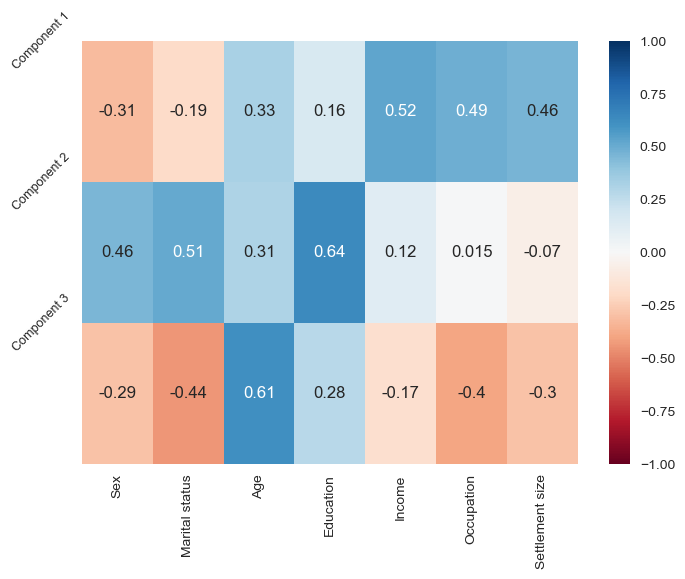

In [33]:
# Heat Map for Principal Components against original features. Again we use the RdBu color scheme and set borders to -1 and 1.
sns.heatmap(df_pca_comp,
            vmin = -1, 
            vmax = 1,
            cmap = 'RdBu',
            annot = True)
plt.yticks([0, 1, 2], 
           ['Component 1', 'Component 2', 'Component 3'],
           rotation = 45,
           fontsize = 9)

In [34]:
pca.transform(segmentation_std)

array([[ 2.51474593,  0.83412239,  2.1748059 ],
       [ 0.34493528,  0.59814564, -2.21160279],
       [-0.65106267, -0.68009318,  2.2804186 ],
       ...,
       [-1.45229829, -2.23593665,  0.89657125],
       [-2.24145254,  0.62710847, -0.53045631],
       [-1.86688505, -2.45467234,  0.66262172]])

In [35]:
scores_pca = pca.transform(segmentation_std)

#### K-means clustering with PCA

In [36]:
# We fit K means using the transformed data from the PCA.
wcss = []
for i in range(1,11):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans_pca.fit(scores_pca)
    wcss.append(kmeans_pca.inertia_)

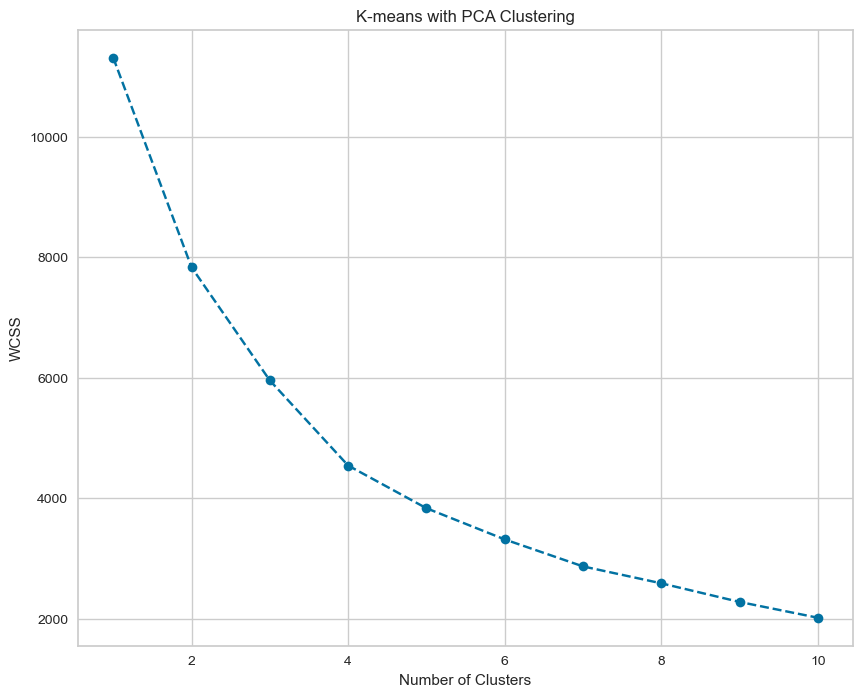

In [37]:
# Plot the Within Cluster Sum of Squares for the K-means PCA model. Here we make a decission about the number of clusters.
# Again it looks like four is the best option.
plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means with PCA Clustering')
plt.show()

#### k Elbow

In [38]:
k_elbow=KElbowVisualizer(KMeans(),k=10)

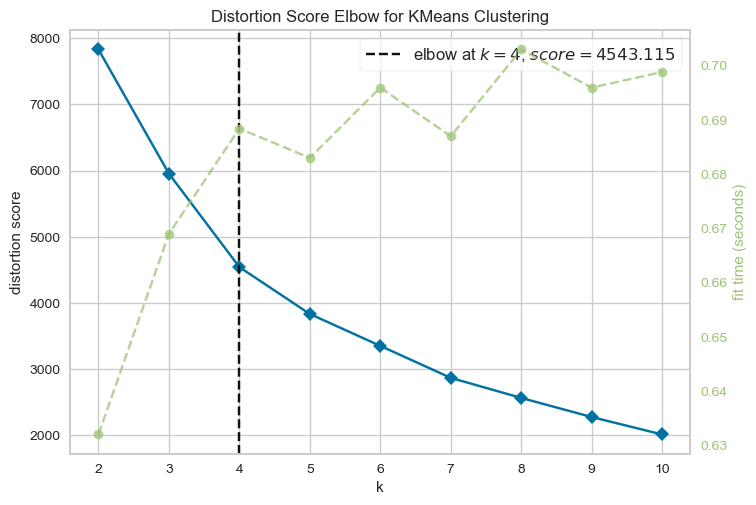

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [39]:
k_elbow.fit(scores_pca)
k_elbow.show()

In [40]:
# We have chosen four clusters, so we run K-means with number of clusters equals four. 
# Same initializer and random state as before.
kmeans_pca = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)

In [41]:
# We fit our data with the k-means pca model
kmeans_pca.fit(scores_pca)

KMeans(n_clusters=4, random_state=42)

#### K-means clustering with PCA Results

In [42]:
# We create a new data frame with the original features and add the PCA scores and assigned clusters.
df_segm_pca_kmeans = pd.concat([df_segmentation.reset_index(drop = True), pd.DataFrame(scores_pca)], axis = 1)
df_segm_pca_kmeans.columns.values[-3: ] = ['Component 1', 'Component 2', 'Component 3']
# The last column we add contains the pca k-means clustering labels.
df_segm_pca_kmeans['Segment K-means PCA'] = kmeans_pca.labels_

In [43]:
df_segm_pca_kmeans

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,Component 1,Component 2,Component 3,Segment K-means PCA
0,0,0,67,2,124670,1,2,2.514746,0.834122,2.174806,3
1,1,1,22,1,150773,1,2,0.344935,0.598146,-2.211603,0
2,0,0,49,1,89210,0,0,-0.651063,-0.680093,2.280419,2
3,0,0,45,1,171565,1,1,1.714316,-0.579927,0.730731,1
4,0,0,53,1,149031,1,1,1.626745,-0.440496,1.244909,1
5,0,0,35,1,144848,0,0,-0.274734,-0.871070,1.310152,2
6,0,0,53,1,156495,1,1,1.729504,-0.416069,1.212454,1
7,0,0,35,1,193621,2,1,2.510377,-0.751256,-0.504917,1
8,0,1,61,2,151591,0,0,0.419891,1.936115,2.209117,3
9,0,1,28,1,174646,2,0,1.098729,0.111131,-1.306561,1


In [44]:
# Component 1	 Career
# Component 2	 Education Lifestyle
# Component 3	 Experience

In [45]:
# We calculate the means by segments.
df_segm_pca_kmeans_freq = df_segm_pca_kmeans.groupby(['Segment K-means PCA']).mean()
df_segm_pca_kmeans_freq

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,Component 1,Component 2,Component 3
Segment K-means PCA,,,,,,,,,,
0,0.900289,0.965318,28.878613,1.060694,107551.500000,0.677746,0.440751,-1.107019,0.703776,-0.781410
1,0.027444,0.168096,35.737564,0.734134,141525.826758,1.267581,1.480274,1.372663,-1.046172,-0.248046
2,0.306522,0.095652,35.313043,0.760870,93692.567391,0.252174,0.039130,-1.046406,-0.902963,1.003644
3,0.505660,0.690566,55.679245,2.128302,158019.101887,1.120755,1.101887,1.687328,2.031200,0.844039


In [46]:
# Calculate the size of each cluster and its proportion to the entire data set.
df_segm_pca_kmeans_freq['N Obs'] = df_segm_pca_kmeans[['Segment K-means PCA','Sex']].groupby(['Segment K-means PCA']).count()
df_segm_pca_kmeans_freq['Prop Obs'] = df_segm_pca_kmeans_freq['N Obs'] / df_segm_pca_kmeans_freq['N Obs'].sum()
df_segm_pca_kmeans_freq = df_segm_pca_kmeans_freq.rename({0:'Ordinary segment', 
                                                          1:'Ambitious clientele',
                                                          2:'Marginalized segment', 
                                                          3:'Prosperous segment'})
df_segm_pca_kmeans_freq

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,Component 1,Component 2,Component 3,N Obs,Prop Obs
Segment K-means PCA,,,,,,,,,,,,
Ordinary segment,0.900289,0.965318,28.878613,1.060694,107551.500000,0.677746,0.440751,-1.107019,0.703776,-0.781410,692,0.3460
Ambitious clientele,0.027444,0.168096,35.737564,0.734134,141525.826758,1.267581,1.480274,1.372663,-1.046172,-0.248046,583,0.2915
Marginalized segment,0.306522,0.095652,35.313043,0.760870,93692.567391,0.252174,0.039130,-1.046406,-0.902963,1.003644,460,0.2300
Prosperous segment,0.505660,0.690566,55.679245,2.128302,158019.101887,1.120755,1.101887,1.687328,2.031200,0.844039,265,0.1325


In [47]:
df_segm_pca_kmeans['Legend'] = df_segm_pca_kmeans['Segment K-means PCA'].map({0:'Ordinary segment', 
                                                          1:'Ambitious clientele',
                                                          2:'Marginalized segment', 
                                                          3:'Prosperous segment'})

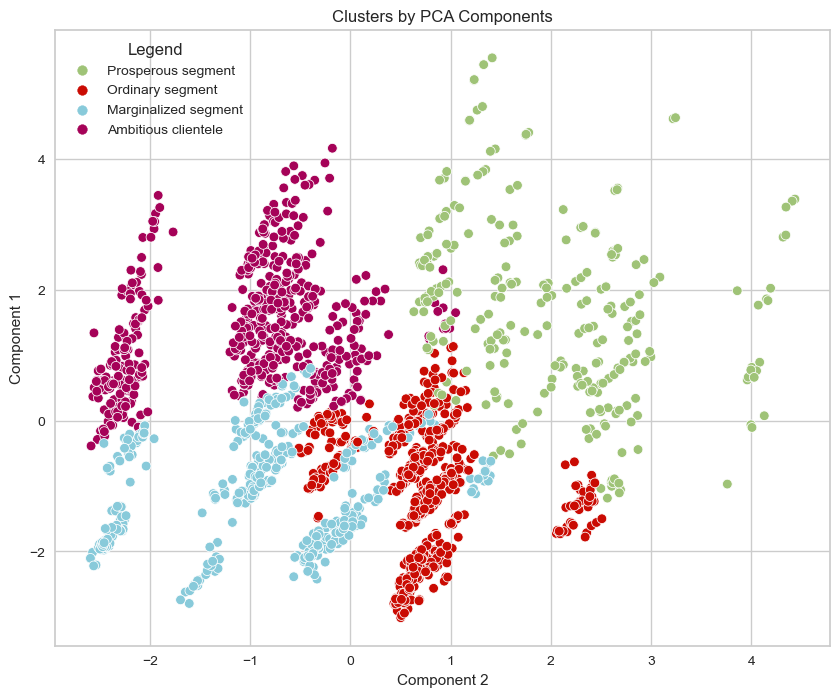

In [48]:
# Plot data by PCA components. The Y axis is the first component, X axis is the second.
x_axis = df_segm_pca_kmeans['Component 2']
y_axis = df_segm_pca_kmeans['Component 1']
plt.figure(figsize = (10, 8))
sns.scatterplot(x=x_axis, y=y_axis, hue = df_segm_pca_kmeans['Legend'], palette = ['g', 'r', 'c', 'm'])
plt.title('Clusters by PCA Components')
plt.show()

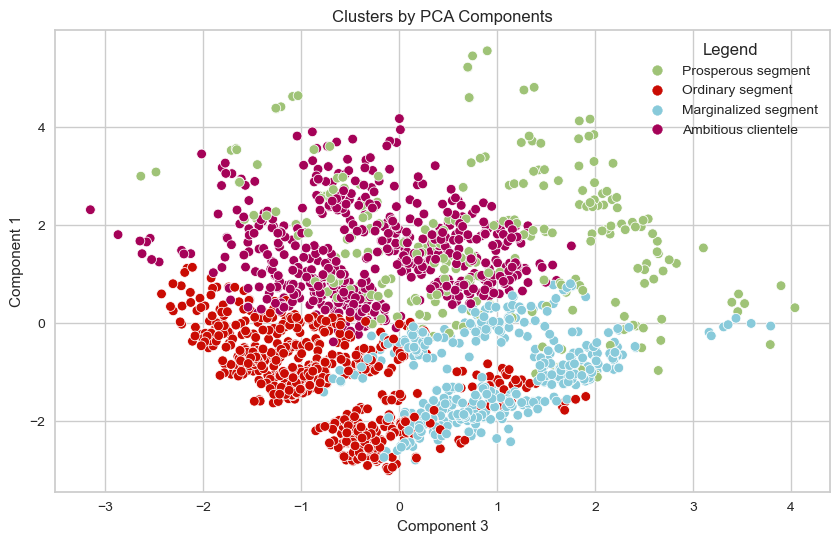

In [49]:
x_axis_1 = df_segm_pca_kmeans['Component 3']
y_axis_1 = df_segm_pca_kmeans['Component 1']
plt.figure(figsize=(10,6))
sns.scatterplot(x=x_axis_1, y=y_axis_1, hue=df_segm_pca_kmeans['Legend'], palette=['g', 'r', 'c', 'm'])
plt.title('Clusters by PCA Components')
plt.show()

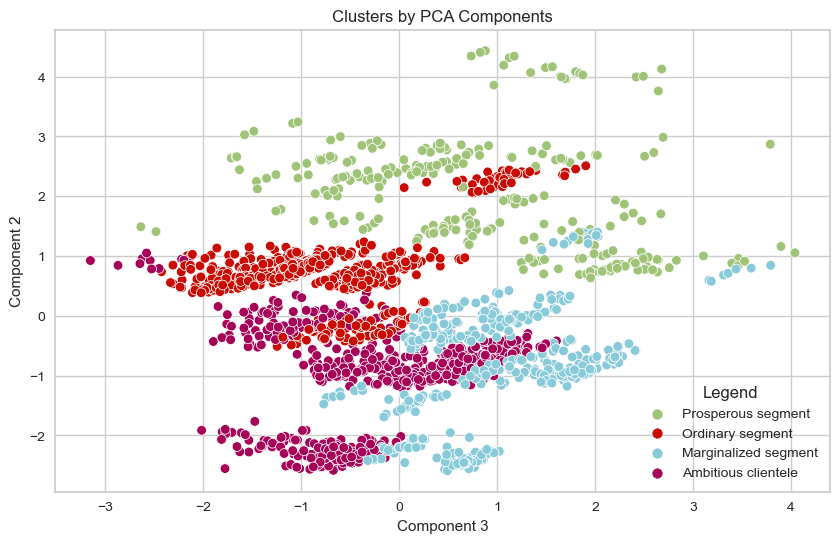

In [50]:
x__axis = df_segm_pca_kmeans['Component 3']
y__axis = df_segm_pca_kmeans['Component 2']
plt.figure(figsize = (10,6))
sns.scatterplot(x=x__axis,y=y__axis, hue = df_segm_pca_kmeans['Legend'], palette = ['g', 'r', 'c', 'm'])
plt.title('Clusters by PCA Components' )
plt.show()

#### Data Export

In [51]:
# We save the objects we'll need in the Purchase Analytics part of the course. We export them as pickle objects.
# We need the scaler, pca and kmeans_pca objects to preprocess and segment the purchase data set.
pickle.dump(scaler, open('scaler.pickle', 'wb'))

In [52]:
pickle.dump(pca, open('pca.pickle', 'wb'))

In [53]:
pickle.dump(kmeans_pca, open('kmeans_pca.pickle', 'wb'))

## Part 2 - EDA

In [54]:
df_purchase=pd.read_excel('Purchase_Dataset.xlsx')

In [55]:
df_purchase.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,Price_5,Promotion_1,Promotion_2,Promotion_3,Promotion_4,Promotion_5,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,200000001,1,0,0,0,0,0,1.59,1.87,2.01,2.09,2.66,0,1,0,0,0,0,0,47.0,1,110866.0,1,0
1,200000001,11,0,0,0,0,0,1.51,1.89,1.99,2.09,2.66,0,0,0,0,0,0,0,47.0,1,110866.0,1,0
2,200000001,12,0,0,0,0,0,1.51,1.89,1.99,2.09,2.66,0,0,0,0,0,0,0,47.0,1,110866.0,1,0
3,200000001,16,0,0,0,0,0,1.52,1.89,1.98,2.09,2.66,0,0,0,0,0,0,0,47.0,1,NaN,1,0
4,200000001,18,0,0,0,0,0,1.52,1.89,1.99,2.09,2.66,0,0,0,0,0,0,0,47.0,1,110866.0,1,0


In [56]:
# How many rowas and columns
print('Rows:',df_purchase.shape[0])
print('Columns:',df_purchase.shape[1])

Rows: 59113
Columns: 24


In [57]:
df_purchase.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,59113.0,2.000003e+08,144.076884,2.000000e+08,2.000001e+08,2.000003e+08,2.000004e+08,2.000005e+08
Day,59113.0,3.494792e+02,212.039054,1.000000e+00,1.610000e+02,3.430000e+02,5.300000e+02,7.300000e+02
Incidence,59113.0,2.492514e-01,0.432583,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
Brand,59113.0,8.443659e-01,1.633605,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,5.000000e+00
Quantity,59113.0,6.910832e-01,1.497595,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.500000e+01
Last_Inc_Brand,59113.0,8.404919e-01,1.631744,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,5.000000e+00
Last_Inc_Quantity,59113.0,2.478643e-01,0.431776,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
Price_2,58936.0,1.780978e+00,0.170862,1.260000e+00,1.580000e+00,1.880000e+00,1.890000e+00,1.900000e+00
Price_3,58913.0,2.006792e+00,0.046864,1.870000e+00,1.970000e+00,2.010000e+00,2.060000e+00,2.140000e+00
Price_4,58928.0,2.159913e+00,0.089842,1.760000e+00,2.120000e+00,2.170000e+00,2.240000e+00,2.260000e+00


In [58]:
df_purchase.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59113 entries, 0 to 59112
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID                 59113 non-null  int64  
 1   Day                59113 non-null  int64  
 2   Incidence          59113 non-null  int64  
 3   Brand              59113 non-null  int64  
 4   Quantity           59113 non-null  int64  
 5   Last_Inc_Brand     59113 non-null  int64  
 6   Last_Inc_Quantity  59113 non-null  int64  
 7   Price_1            58955 non-null  object 
 8   Price_2            58936 non-null  float64
 9   Price_3            58913 non-null  float64
 10  Price_4            58928 non-null  float64
 11  Price_5            58974 non-null  float64
 12  Promotion_1        59113 non-null  int64  
 13  Promotion_2        59113 non-null  int64  
 14  Promotion_3        59113 non-null  int64  
 15  Promotion_4        59113 non-null  int64  
 16  Promotion_5        591

In [59]:
df_purchase.columns

Index(['ID', 'Day', 'Incidence', 'Brand', 'Quantity', 'Last_Inc_Brand',
       'Last_Inc_Quantity', 'Price_1', 'Price_2', 'Price_3', 'Price_4',
       'Price_5', 'Promotion_1', 'Promotion_2', 'Promotion_3', 'Promotion_4',
       'Promotion_5', 'Sex', 'Marital status', 'Age', 'Education', 'Income',
       'Occupation', 'Settlement size'],
      dtype='object')

#### Lets find missing value

In [60]:
df_purchase.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,Price_5,Promotion_1,Promotion_2,Promotion_3,Promotion_4,Promotion_5,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,200000001,1,0,0,0,0,0,1.59,1.87,2.01,2.09,2.66,0,1,0,0,0,0,0,47.0,1,110866.0,1,0
1,200000001,11,0,0,0,0,0,1.51,1.89,1.99,2.09,2.66,0,0,0,0,0,0,0,47.0,1,110866.0,1,0
2,200000001,12,0,0,0,0,0,1.51,1.89,1.99,2.09,2.66,0,0,0,0,0,0,0,47.0,1,110866.0,1,0
3,200000001,16,0,0,0,0,0,1.52,1.89,1.98,2.09,2.66,0,0,0,0,0,0,0,47.0,1,NaN,1,0
4,200000001,18,0,0,0,0,0,1.52,1.89,1.99,2.09,2.66,0,0,0,0,0,0,0,47.0,1,110866.0,1,0


In [61]:
df_purchase.isnull().sum()

ID                     0
Day                    0
Incidence              0
Brand                  0
Quantity               0
Last_Inc_Brand         0
Last_Inc_Quantity      0
Price_1              158
Price_2              177
Price_3              200
Price_4              185
Price_5              139
Promotion_1            0
Promotion_2            0
Promotion_3            0
Promotion_4            0
Promotion_5            0
Sex                    0
Marital status         0
Age                  190
Education              0
Income               309
Occupation             0
Settlement size        0
dtype: int64

#### Inference
* **Price_1 column has 158 missing values.**
* **Price_2 column has 177 missing values.**
* **Price_3 column has 200 missing values.**
* **Price_4 column has 185 missing values.**
* **Price_5 column has 139 missing values.**
* **Age column has 190 missing values.**
* **Income column has 309 missing values.**

In [62]:
df_purchase[df_purchase.isnull().any(axis=1)]

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,Price_5,Promotion_1,Promotion_2,Promotion_3,Promotion_4,Promotion_5,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
3,200000001,16,0,0,0,0,0,1.52,1.89,1.98,2.09,2.66,0,0,0,0,0,0,0,47.0,1,NaN,1,0
17,200000001,92,0,0,0,0,0,1.39,1.46,1.99,2.12,2.40,0,0,0,0,0,0,0,47.0,1,NaN,1,0
20,200000001,111,0,0,0,1,1,1.47,1.90,1.99,1.97,2.67,1,1,0,0,0,0,0,47.0,1,NaN,1,0
25,200000001,145,0,0,0,0,0,1.59,1.87,NaN,2.16,NaN,0,1,0,0,0,0,0,47.0,1,110866.0,1,0
38,200000001,237,0,0,0,0,0,1.46,1.89,1.93,2.16,2.67,1,0,0,0,0,0,0,47.0,1,NaN,1,0
53,200000001,327,1,4,3,0,0,1.47,1.89,2.01,1.90,2.71,0,0,0,1,0,0,0,47.0,1,NaN,1,0
61,200000001,381,0,0,0,0,0,1.24,1.87,2.02,2.21,2.71,1,0,0,0,0,0,0,47.0,1,NaN,1,0
75,200000001,494,0,0,0,0,0,1.33,1.57,2.06,2.21,2.58,1,1,0,0,0,0,0,47.0,1,NaN,1,0
90,200000001,637,0,0,0,0,0,1.31,1.56,2.00,2.24,2.79,1,1,1,0,0,0,0,47.0,1,NaN,1,0
111,200000002,63,0,0,0,0,0,1.39,1.89,1.91,2.12,2.67,0,0,0,0,0,1,1,52.0,2,NaN,2,1


In [63]:
def fill_missing_values_by_id(df):
    # Fill missing Age with mode for each group (ID)
    df['Age'] = df.groupby('ID')['Age'].transform(lambda x: x.fillna(x.mode().iloc[0] \
                                                                     if not x.mode().empty else None))

    return df

# Example usage
data = fill_missing_values_by_id(df_purchase)

#### Inference

* **We treated 190 missing values for Age column. We replaced missing 'Age' values within each group with the mode of the available 'Age' values in that group of 'ID' column.**

In [64]:
def fill_missing_income_by_id(df):
    # Group by ID and fill missing Income with mode for each group
    df['Income'] = df.groupby('ID')['Income'].transform(lambda x: x.fillna(x.mode().iloc[0] \
                                                                           if not x.mode().empty else None))
    
    return df

# Example usage
data = fill_missing_income_by_id(df_purchase)

#### Inference
* **We treated 309 missing values for Income column. We replaced missing 'Income' values within each group with the mode of the available 'Income' values in that group of 'ID' column.**

In [65]:
# Droping all NaN values within the DataFrame
df_purchase.dropna(inplace=True)

In [66]:
df_purchase.isnull().sum()

ID                   0
Day                  0
Incidence            0
Brand                0
Quantity             0
Last_Inc_Brand       0
Last_Inc_Quantity    0
Price_1              0
Price_2              0
Price_3              0
Price_4              0
Price_5              0
Promotion_1          0
Promotion_2          0
Promotion_3          0
Promotion_4          0
Promotion_5          0
Sex                  0
Marital status       0
Age                  0
Education            0
Income               0
Occupation           0
Settlement size      0
dtype: int64

#### Inference

* **We performed missing value treatement for all columns. Now our dataframe is ready for Analysis.**

In [67]:
df_purchase.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,58694.0,2.000003e+08,144.315842,2.000000e+08,2.000001e+08,2.000003e+08,2.000004e+08,2.000005e+08
Day,58694.0,3.494306e+02,212.045789,1.000000e+00,1.610000e+02,3.430000e+02,5.300000e+02,7.300000e+02
Incidence,58694.0,2.493952e-01,0.432667,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
Brand,58694.0,8.442941e-01,1.633073,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,5.000000e+00
Quantity,58694.0,6.919617e-01,1.498724,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.500000e+01
Last_Inc_Brand,58694.0,8.408526e-01,1.631666,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,5.000000e+00
Last_Inc_Quantity,58694.0,2.480833e-01,0.431904,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
Price_2,58694.0,1.781002e+00,0.170865,1.260000e+00,1.580000e+00,1.880000e+00,1.890000e+00,1.900000e+00
Price_3,58694.0,2.006789e+00,0.046868,1.870000e+00,1.970000e+00,2.010000e+00,2.060000e+00,2.140000e+00
Price_4,58694.0,2.159950e+00,0.089821,1.760000e+00,2.120000e+00,2.170000e+00,2.240000e+00,2.260000e+00


#### Inference
* **We have Days in between 1 to 730**
* **We have total 5 Brands**
* **Incidence, Brand, Quantity, Last_Inc_Brand, Last_Inc_Quantity, Promotion_1, Promotion_2, Promotion_3, Promotion_4, Promotion_5, Sex, Marital status, Education, Occupation, Settlement size are Number Categories Columns**
* **Age of people purchasing is 18 to 75**

#### Heatmap to show the correlation between the features

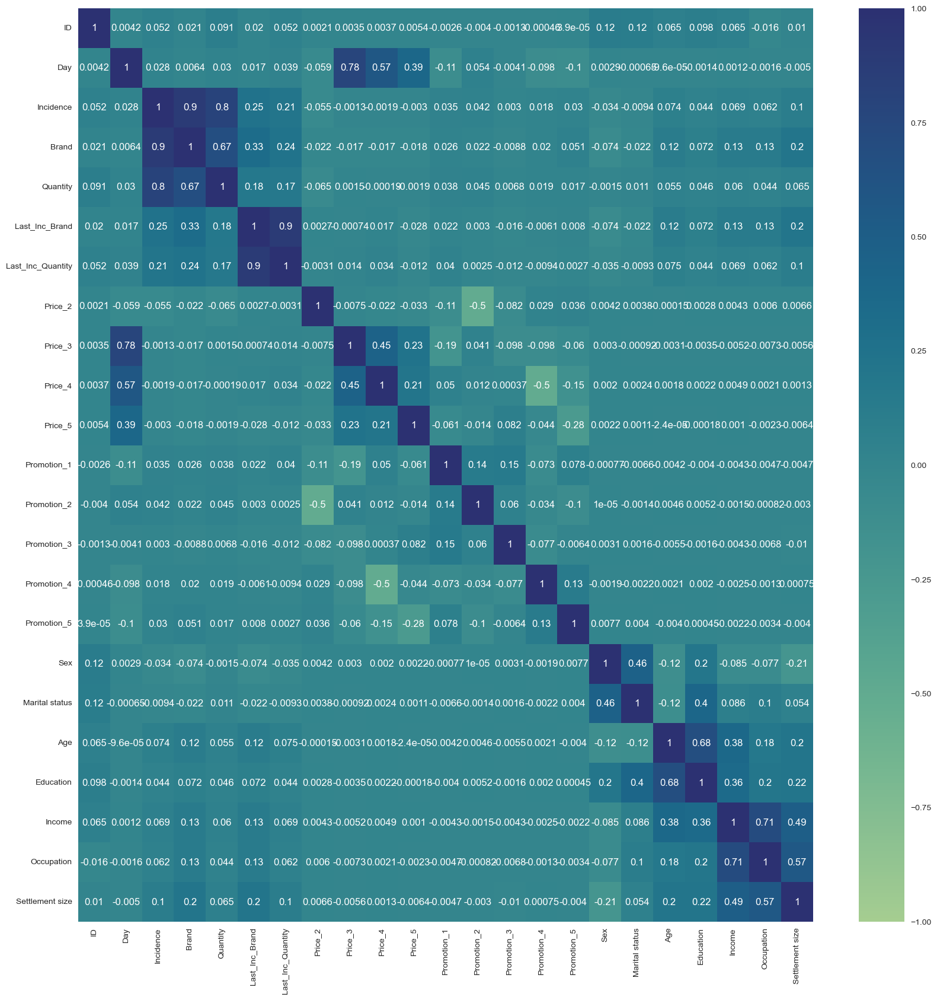

In [68]:
plt.figure(figsize=(20,20))
sns.heatmap(df_purchase.corr(),annot=True,vmax=+1,vmin=-1,cmap="crest")
plt.show()

#### Inference

Perfect Positive Correlation (1) <br>
Strong Positive Correlation (0.7 to 0.9) <br>
No Correlation (0) <br>
Strong Negative Correlation (-0.7 to -0.9) <br>
<br>
**Heatmap shows following correlations:** <br>
**1. Day and Price_3 has strong positive correlation.** <br>
**2. Incidence and Brand has strong positive correlation.** <br>
**3. Incidence and Quality has strong positie correlation.** <br>
**4. Brand and Quantity has strong positive correlation.** <br>
**5. Last_Inc_Brand and Last_Inc_Quantity has strong positive correlation.** <br>
**6. Age and Education has strong positive correlation.** <br>
**7. Income and Occupation has strong positive correlation.** <br>

#### Univariate Analysis

In [69]:
num_cols=['Day','Quantity','Price_1', 'Price_2', 'Price_3', 'Price_4','Price_5','Age', 'Income']

In [70]:
cat_cols=['Incidence','Brand','Last_Inc_Brand','Last_Inc_Quantity','Promotion_1','Promotion_2','Promotion_3',\
          'Promotion_4','Promotion_5','Sex', 'Marital status','Education','Occupation','Settlement size']

#### For Numerical Columns

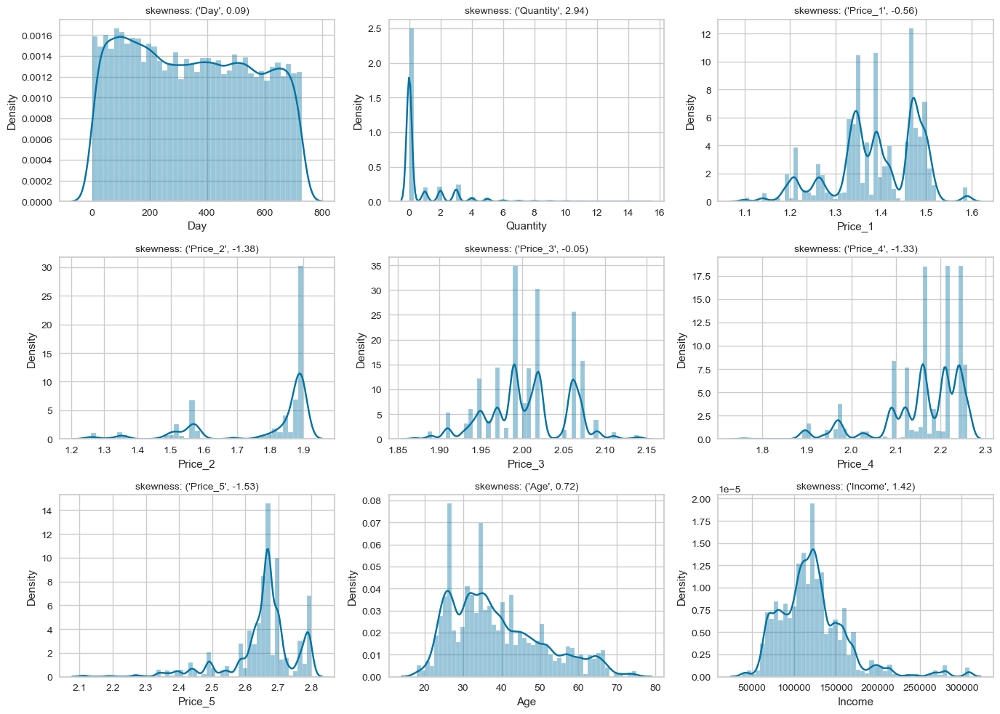

In [71]:
plt.figure(figsize=(14,10))
t = 1
for i in num_cols:
    plt.subplot(3,3,t)
    sns.distplot(df_purchase[i])
    plt.title(f'skewness: {i,round(data[i].skew(),2)}',fontsize=10)
    t+=1
plt.tight_layout()
plt.show()

#### Inference

Perfectly Symmetric (Skewness = 0) <br>
Moderately Skewed (0.5 to 1 or -0.5 to -1) <br>
Highly Skewed (1 to 2 or -1 to -2) <br>
Very Highly Skewed (Greater than 2 or Less than -2) <br>

**1. Day column skweness value is 0.09 hence it is Prefectly Symmetric.** <br>
**2. Quality column skewness value is 2.94 hence it is Very Highly Right Skewed.** <br>
**3. Price_1 column skewness value is -0.56 hence it is Moderately Left Skewed.** <br>
**4. Price_2 column skewness value is -1.38 hence it is Highly Skewed.** <br>
**5. Price_3 column skewness value is -0.05 hence it is Perfectly Symmetric.** <br>
**6. Price_4 column skewness value is -1.33 hence it is Highly Skewed.** <br>
**7. Price_5 column skewness value is -1.53 hence it is Highly Skewed.** <br>
**8. Age column skewness value is 0.72 hence it is Moderately Skewed.** <br>
**9. Income column skewness value is 1.42 hence it is Highly Skewed.** <br>

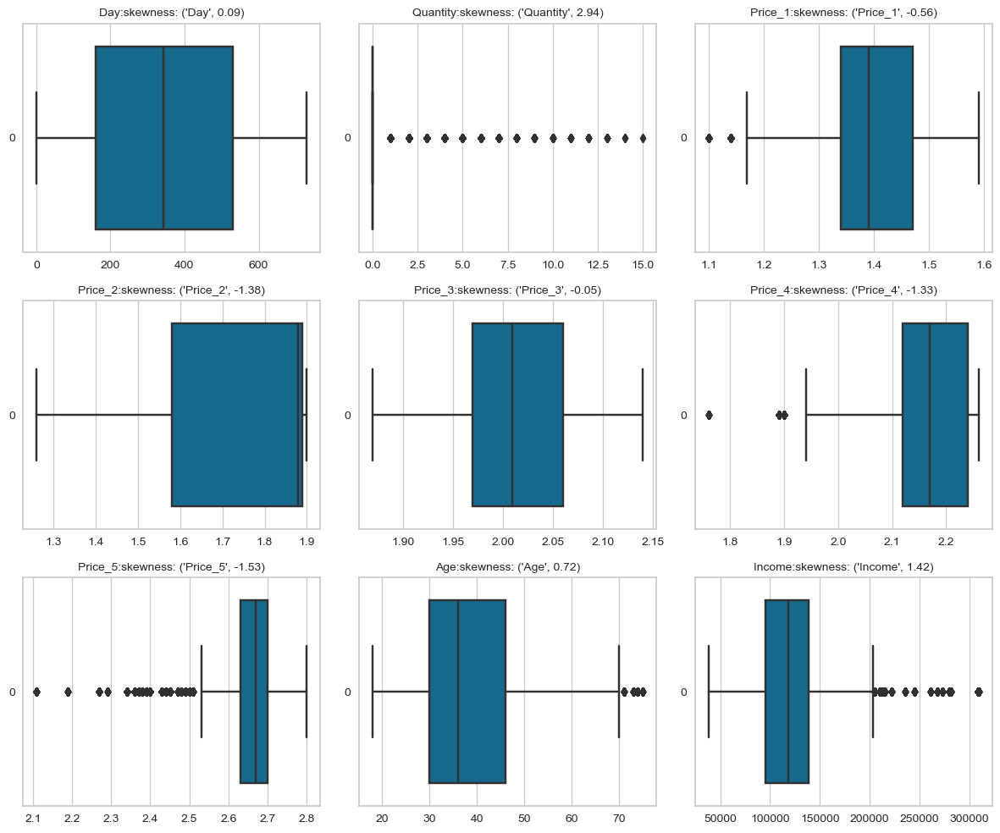

In [72]:
plt.figure(figsize=(12,10))
t = 1
for i in num_cols:
    plt.subplot(3,3,t)
    sns.boxplot(data[i],orient='h')
    plt.title(f'{i}:skewness: {i,round(df_purchase[i].skew(),2)}',fontsize=10)
    t+=1
plt.tight_layout()
plt.show()

####  Inference

Perfectly Symmetric (Skewness = 0) <br>
Moderately Skewed (0.5 to 1 or -0.5 to -1) <br>
Highly Skewed (1 to 2 or -1 to -2) <br>
Very Highly Skewed (Greater than 2 or Less than -2) <br>

**1. Day column skweness value is 0.09 hence it is Prefectly Symmetric.** <br>
**2. Quality column skewness value is 2.94 hence it is Very Highly Right Skewed.** <br>
**3. Price_1 column skewness value is -0.56 hence it is Moderately Left Skewed.** <br>
**4. Price_2 column skewness value is -1.38 hence it is Highly Skewed.** <br>
**5. Price_3 column skewness value is -0.05 hence it is Perfectly Symmetric.** <br>
**6. Price_4 column skewness value is -1.33 hence it is Highly Skewed.** <br>
**7. Price_5 column skewness value is -1.53 hence it is Highly Skewed.** <br>
**8. Age column skewness value is 0.72 hence it is Moderately Skewed.** <br>
**9. Income column skewness value is 1.42 hence it is Highly Skewed.** <br>

#### For Categorical Columns

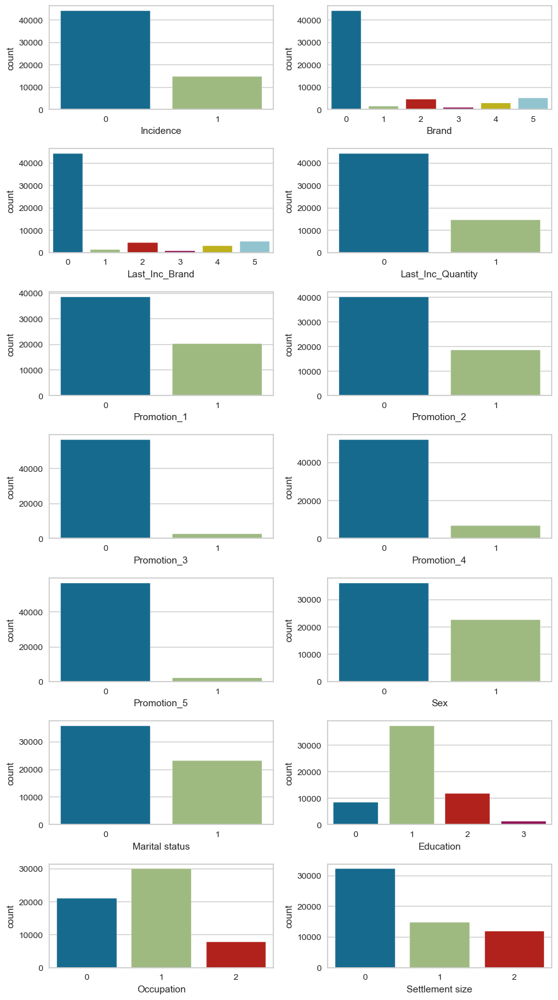

In [73]:
plt.figure(figsize=(9,16))
t=1
for i in cat_cols:
    plt.subplot(7,2,t)
    sns.countplot(x=df_purchase[i])
    t+=1
plt.tight_layout()
plt.show() 

#### Inference

**1. Incidence column has two categories 0 and 1. And count of category 0 is highest.** <br>
**2. Brand column has six categories 0, 1, 2, 3, 4 and 5. And count of category 0 is highest.** <br>
**3. Last_Inc_Brand column has six categories 0, 1, 2, 3, 4 and 5. And count of category 0 is highest.** <br>
**4. Last_Inc_Quantity column has two categories 0 and 1. And count of category 0 is highest.** <br>
**5. Promotion_1 column has two categories 0 and 1. And count of category 0 is highest.** <br>
**6. Promotion_2 column has two categories 0 and 1. And count of category 0 is highest.** <br>
**7. Promotion_3 column has two categories 0 and 1. And count of category 0 is highest.** <br>
**8. Promotion_4 column has two categories 0 and 1. And count of category 0 is highest.** <br>
**9. Promotion_5 column has two categories 0 and 1. And count of category 0 is highest.** <br>
**10. Sex column has two categories 0 and 1. And count of category 0 is highest.** <br>
**11. Martial status column has two categories 0 and 1. And count of category 0 is highest.** <br>
**12. Education column has four categories 0, 1, 2 and 3. And count of category 1 is highest.** <br>
**13. Occupation column has three categories 0, 1 and 2. And count of category 1 is highest.** <br>
**14. Settlement size column has three categories 0, 1 and 2. And count of category 0 is highest.**<br>

## Part 3 - Purchase Analysis

#### Data Segmentation

In [74]:
# We load our pickled objects in order to segment the purchase data set.
scaler = pickle.load(open('scaler.pickle', 'rb'))

In [75]:
pca = pickle.load(open('pca.pickle', 'rb'))

In [76]:
kmeans_pca = pickle.load(open('kmeans_pca.pickle', 'rb'))

#### Standardization

In [77]:
df_purchase.columns

Index(['ID', 'Day', 'Incidence', 'Brand', 'Quantity', 'Last_Inc_Brand',
       'Last_Inc_Quantity', 'Price_1', 'Price_2', 'Price_3', 'Price_4',
       'Price_5', 'Promotion_1', 'Promotion_2', 'Promotion_3', 'Promotion_4',
       'Promotion_5', 'Sex', 'Marital status', 'Age', 'Education', 'Income',
       'Occupation', 'Settlement size'],
      dtype='object')

In [78]:
# We standardize the purchase data in the same way we did the segmentation data, using the standard scaler.
features = df_purchase[['Sex', 'Marital status', 'Age', 'Education', 'Income', 'Occupation', 'Settlement size']]
df_purchase_segm_std = scaler.transform(features)

#### PCA

In [79]:
# We apply pca on the purchase data and obtain 3 principal components for each row in the table. 
df_purchase_segm_pca = pca.transform(df_purchase_segm_std)

#### K-means PCA

In [80]:
# Based on the principal components, we use the predict method from pca to segment the purchase data into the four segments.
purchase_segm_kmeans_pca = kmeans_pca.predict(df_purchase_segm_pca)

In [81]:
# Copy resulting data frame as a purchase predictors data frame. 
# We'll be changing the predictors data frame, by adding and changing columns.
# Therefore, we want to keep an original copy.
df_purchase_predictors = df_purchase.copy()

In [82]:
# Add segment information as a new column in our predictors data frame.
df_purchase_predictors['Segment'] = purchase_segm_kmeans_pca

#### Descriptive Analysis by Segmentation

#### Data Analysis by Customer

In [83]:
df_purchase_predictors.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,Price_5,Promotion_1,Promotion_2,Promotion_3,Promotion_4,Promotion_5,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,Segment
0,200000001,1,0,0,0,0,0,1.59,1.87,2.01,2.09,2.66,0,1,0,0,0,0,0,47.0,1,110866.0,1,0,2
1,200000001,11,0,0,0,0,0,1.51,1.89,1.99,2.09,2.66,0,0,0,0,0,0,0,47.0,1,110866.0,1,0,2
2,200000001,12,0,0,0,0,0,1.51,1.89,1.99,2.09,2.66,0,0,0,0,0,0,0,47.0,1,110866.0,1,0,2
3,200000001,16,0,0,0,0,0,1.52,1.89,1.98,2.09,2.66,0,0,0,0,0,0,0,47.0,1,110866.0,1,0,2
4,200000001,18,0,0,0,0,0,1.52,1.89,1.99,2.09,2.66,0,0,0,0,0,0,0,47.0,1,110866.0,1,0,2


In [84]:
# Purchase occasions by customer ID
temp1 = df_purchase_predictors[['ID', 'Incidence']].groupby(['ID'], as_index = False).count()
temp1 = temp1.set_index('ID')
temp1 = temp1.rename(columns = {'Incidence': 'N_Visits'})
temp1.head()

,N_Visits
ID,
200000001,101
200000002,87
200000003,97
200000004,85
200000005,111


In [85]:
# Number of purchases per customer ID
temp2 = df_purchase_predictors[['ID', 'Incidence']].groupby(['ID'], as_index = False).sum()
temp2 = temp2.set_index('ID')
temp2 = temp2.rename(columns = {'Incidence': 'N_Purchases'})
temp3 = temp1.join(temp2)
temp3.head()

,N_Visits,N_Purchases
ID,,
200000001,101,9
200000002,87,11
200000003,97,10
200000004,85,11
200000005,111,13


In [86]:
# Average number of purchases by customer ID
temp3['Average_N_Purchases'] = temp3['N_Purchases'] / temp3['N_Visits']
temp3.head()

,N_Visits,N_Purchases,Average_N_Purchases
ID,,,
200000001,101,9,0.089109
200000002,87,11,0.126437
200000003,97,10,0.103093
200000004,85,11,0.129412
200000005,111,13,0.117117


In [87]:
# We obtain the segment for each customer in the data set.
temp4 = df_purchase_predictors[['ID', 'Segment']].groupby(['ID'], as_index = False).mean()
temp4 = temp4.set_index('ID')
df_purchase_descr = temp3.join(temp4)

In [88]:
df_purchase_descr.head()

,N_Visits,N_Purchases,Average_N_Purchases,Segment
ID,,,,
200000001,101,9,0.089109,2.0
200000002,87,11,0.126437,3.0
200000003,97,10,0.103093,2.0
200000004,85,11,0.129412,2.0
200000005,111,13,0.117117,1.0


#### Segment Proportions

In [89]:
# We calculate the proportions of each segment and set the appropriate column name. 
segm_prop = df_purchase_descr[['N_Purchases', 'Segment']].groupby(['Segment']).count() / df_purchase_descr.shape[0]
segm_prop = segm_prop.rename(columns = {'N_Purchases': 'Segment Proportions'})
segm_prop.head()

,Segment Proportions
Segment,
0.0,0.206
1.0,0.220
2.0,0.378
3.0,0.196


Text(0.5, 1.0, 'Segment Proportions')

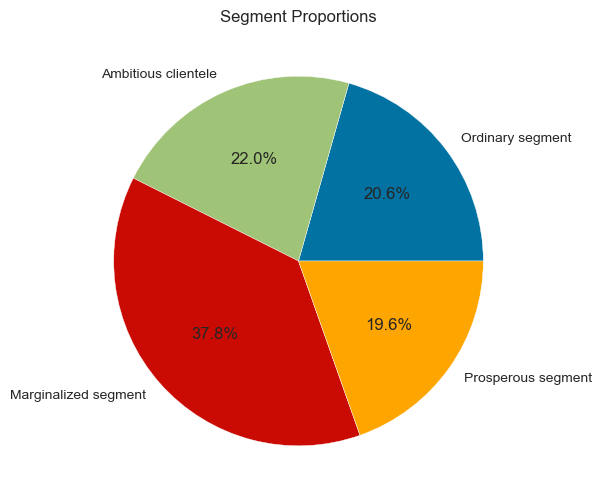

In [90]:
# We plot the segment proportions as a pie chart. 
# We can easily see which is the largest segment and the relative sizes of each segment.
plt.figure(figsize = (9, 6))
plt.pie(segm_prop['Segment Proportions'],
        labels = ['Ordinary segment', 'Ambitious clientele', 'Marginalized segment', 'Prosperous segment'],
        autopct = '%1.1f%%', 
        colors = ('b', 'g', 'r', 'orange'))
plt.title('Segment Proportions')

#### Purchase Occasion and Purchase Incidence

In [91]:
# We calculate the mean by the four segments. It will help us determine the average customer behaivour in each segment.
segments_mean = df_purchase_descr.groupby(['Segment']).mean()
segments_mean

,N_Visits,N_Purchases,Average_N_Purchases
Segment,,,
0.0,117.699029,24.902913,0.212773
1.0,123.463636,39.827273,0.283068
2.0,113.730159,22.756614,0.201588
3.0,117.295918,34.602041,0.284478


In [92]:
# We calculate the standard deviation by segments. It will help us determine how homogoneus each of the segments is.
segments_std = df_purchase_descr.groupby(['Segment']).std()

Text(0.5, 1.0, 'Average Number of Store Visits by Segment')

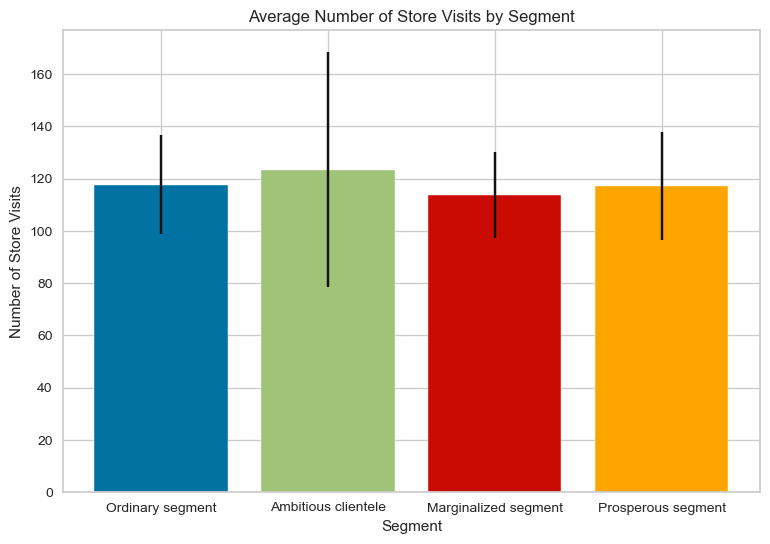

In [93]:
# We plot the average number of store visits for each of the four segments using a bar chart.
# We display the standard deviation as a straight line. The bigger the length, the higher the standard deviation is.
plt.figure(figsize = (9, 6))
plt.bar(x = (0, 1, 2, 3),
        tick_label = ('Ordinary segment', 'Ambitious clientele', 'Marginalized segment', 'Prosperous segment'), 
        height = segments_mean['N_Visits'],
        yerr = segments_std['N_Visits'],
        color = ('b', 'g', 'r', 'orange'))
plt.xlabel('Segment')
plt.ylabel('Number of Store Visits')
plt.title('Average Number of Store Visits by Segment')

Text(0.5, 1.0, 'Number of Purchases by Segment')

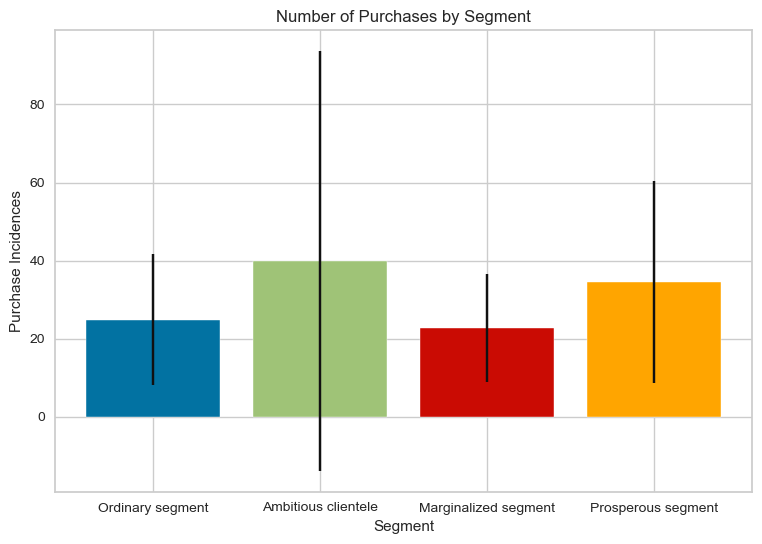

In [94]:
# We display the average number of purchases by segments. 
# They will help us understand how often each group buys chocholate candy bars.
plt.figure(figsize = (9, 6))
plt.bar(x = (0, 1, 2, 3),
        tick_label = ('Ordinary segment', 'Ambitious clientele', 'Marginalized segment', 'Prosperous segment'), 
        height = segments_mean['N_Purchases'],
        yerr = segments_std['N_Purchases'],
        color = ('b', 'g', 'r', 'orange'))
plt.xlabel('Segment')
plt.ylabel('Purchase Incidences')
plt.title('Number of Purchases by Segment')

Text(0.5, 1.0, 'Average Number of Purchases by Segment')

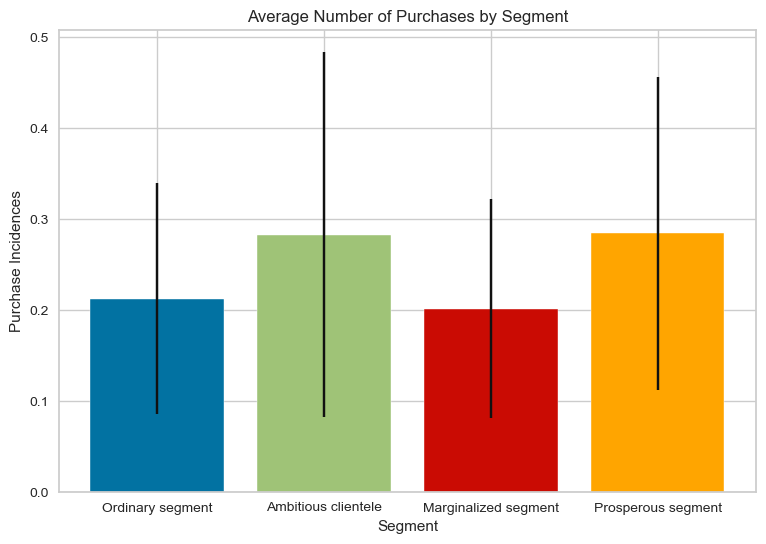

In [95]:
# We display the average number of purchases.
plt.figure(figsize = (9, 6))
plt.bar(x = (0, 1, 2, 3), 
        tick_label = ('Ordinary segment', 'Ambitious clientele', 'Marginalized segment', 'Prosperous segment'),
        height = segments_mean['Average_N_Purchases'], 
        yerr = segments_std['Average_N_Purchases'], 
        color = ('b', 'g', 'r', 'orange'))
plt.xlabel('Segment')
plt.ylabel('Purchase Incidences')
plt.title('Average Number of Purchases by Segment')

#### Brand Choice

In [96]:
# Select only rows where incidence is one. In other words, we are only interested in the times a purchase was made.
df_purchase_incidence = df_purchase_predictors[df_purchase_predictors['Incidence'] == 1]

In [97]:
# Here we make dummies for each of the five brands.
brand_dummies = pd.get_dummies(df_purchase_incidence['Brand'], prefix = 'Brand', prefix_sep = '_')
brand_dummies['Segment'], brand_dummies['ID'] = df_purchase_incidence['Segment'], df_purchase_incidence['ID']
brand_dummies

,Brand_1,Brand_2,Brand_3,Brand_4,Brand_5,Segment,ID
6,0,1,0,0,0,2,200000001
11,0,0,0,0,1,2,200000001
19,1,0,0,0,0,2,200000001
24,0,0,0,1,0,2,200000001
30,0,1,0,0,0,2,200000001
53,0,0,0,1,0,2,200000001
80,0,1,0,0,0,2,200000001
81,0,1,0,0,0,2,200000001
98,0,0,0,0,1,2,200000001
102,0,0,0,1,0,3,200000002


In [98]:
temp = brand_dummies.groupby(['ID'], as_index = True).mean()

In [99]:
mean_brand_choice = temp.groupby(['Segment'], as_index = True).mean()

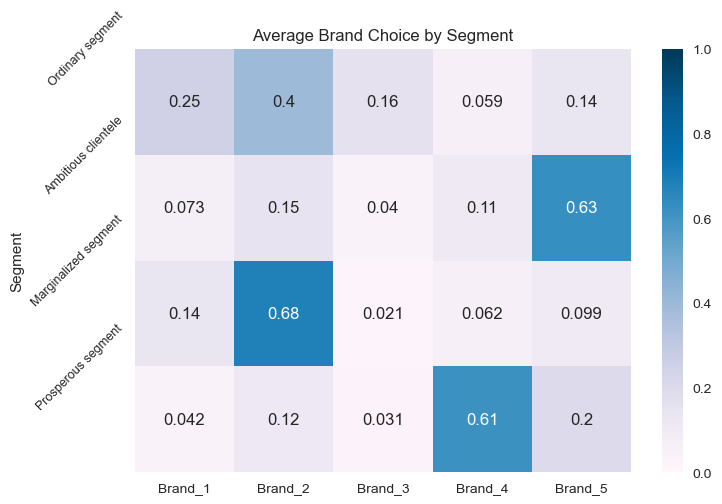

In [100]:
sns.heatmap(mean_brand_choice,
            vmin = 0, 
            vmax = 1,
            cmap = 'PuBu',
            annot = True)
plt.yticks([0, 1, 2, 3], ['Ordinary segment', 'Ambitious clientele', 'Marginalized segment', 'Prosperous segment'], rotation = 45, fontsize = 9)
plt.title('Average Brand Choice by Segment')
plt.show()

#### Revenue

In [101]:
# Compute the revenue for brand 1.
# For each entry where Brand 1 was purchased, 
# we multiply the price of the brand for that particular day by the quantity of the product purchased.
temp = df_purchase_predictors[df_purchase_predictors['Brand'] == 1]
temp.loc[:, 'Revenue Brand 1'] = temp['Price_1'] * temp['Quantity']
segments_brand_revenue = pd.DataFrame()
segments_brand_revenue[['Segment', 'Revenue Brand 1']] = temp[['Segment', 'Revenue Brand 1']].groupby(['Segment'], as_index = False).sum()
segments_brand_revenue

,Segment,Revenue Brand 1
0,0,2611.19
1,1,736.09
2,2,2258.90
3,3,699.47


In [102]:
# Compute revenue for brand 2. We use the same formula, but here we filter our data to contain only purchases of brand 2.
temp = df_purchase_predictors[df_purchase_predictors['Brand'] == 2]
temp.loc[:, 'Revenue Brand 2'] = temp['Price_2'] * temp['Quantity']
segments_brand_revenue[['Segment', 'Revenue Brand 2']] = temp[['Segment', 'Revenue Brand 2']].groupby(['Segment'], as_index = False).sum()

In [103]:
# Compute revenue for brand 3
temp = df_purchase_predictors[df_purchase_predictors['Brand'] == 3]
temp.loc[:,'Revenue Brand 3'] = temp['Price_3']*temp['Quantity']
segments_brand_revenue[['Segment','Revenue Brand 3']] = temp[['Revenue Brand 3','Segment']].groupby(['Segment'], as_index = False).sum()

In [104]:
# Compute revenue for brand 4
temp = df_purchase_predictors[df_purchase_predictors['Brand'] == 4]
temp.loc[:,'Revenue Brand 4'] = temp['Price_4']*temp['Quantity']
segments_brand_revenue[['Segment','Revenue Brand 4']] = temp[['Revenue Brand 4','Segment']].groupby(['Segment'], as_index = False).sum()

In [105]:
# Compute revenue for brand 5
temp = df_purchase_predictors[df_purchase_predictors['Brand'] == 5]
temp.loc[:,'Revenue Brand 5'] = temp['Price_5']*temp['Quantity']
segments_brand_revenue[['Segment','Revenue Brand 5']] = temp[['Revenue Brand 5','Segment']].groupby(['Segment'], as_index = False).sum()

In [106]:
# We compute the total revenue for each of the segments. We simply sum the revenue for each of the five brands.
segments_brand_revenue['Total Revenue'] = (segments_brand_revenue['Revenue Brand 1'] +
                                           segments_brand_revenue['Revenue Brand 2'] +
                                           segments_brand_revenue['Revenue Brand 3'] +
                                           segments_brand_revenue['Revenue Brand 4'] +
                                           segments_brand_revenue['Revenue Brand 5'] )
segments_brand_revenue

,Segment,Revenue Brand 1,Revenue Brand 2,Revenue Brand 3,Revenue Brand 4,Revenue Brand 5,Total Revenue
0,0,2611.19,4768.52,3909.17,861.38,2439.75,14590.01
1,1,736.09,1746.42,664.75,2363.84,19440.92,24952.02
2,2,2258.90,13955.14,716.25,1629.31,2230.50,20790.10
3,3,699.47,1298.23,731.35,14185.57,5509.69,22424.31


In [107]:
# We further modify our table to include the segment proportions. 
# It is interesting to see the size of the segment compared to the revenue they bring.
# We also add the labels for the segments.s
segments_brand_revenue['Segment Proportions'] = segm_prop['Segment Proportions']
segments_brand_revenue['Segment'] = segments_brand_revenue['Segment'].map({0:'Ordinary segment',
                                                                           1:'Ambitious clientele',
                                                                           2:'Marginalized segment',
                                                                           3:'Prosperous segment'})
segments_brand_revenue = segments_brand_revenue.set_index(['Segment'])
segments_brand_revenue

,Revenue Brand 1,Revenue Brand 2,Revenue Brand 3,Revenue Brand 4,Revenue Brand 5,Total Revenue,Segment Proportions
Segment,,,,,,,
Ordinary segment,2611.19,4768.52,3909.17,861.38,2439.75,14590.01,0.206
Ambitious clientele,736.09,1746.42,664.75,2363.84,19440.92,24952.02,0.220
Marginalized segment,2258.90,13955.14,716.25,1629.31,2230.50,20790.10,0.378
Prosperous segment,699.47,1298.23,731.35,14185.57,5509.69,22424.31,0.196


#### Data Preparation

In [108]:
#load data
df_purchase = pd.read_csv('purchase data.csv')

# Import Scaler
scaler = pickle.load(open('scaler.pickle', 'rb'))
# Import PCA
pca = pickle.load(open('pca.pickle', 'rb'))
# Import K-Means
kmeans_pca = pickle.load(open('kmeans_pca.pickle', 'rb'))
# Standardization
features = df_purchase[['Sex', 'Marital status', 'Age', 'Education', 'Income', 'Occupation', 'Settlement size']]
df_purchase_segm_std = scaler.transform(features)
# Apply PCA
df_purchase_segm_pca = pca.transform(df_purchase_segm_std)
# Segment data
purchase_segm_kmeans_pca = kmeans_pca.predict(df_purchase_segm_pca)

# Create a copy of the data frame
df_purchase_predictors = df_purchase.copy()
# Add segment labels
df_purchase_predictors['Segment'] = purchase_segm_kmeans_pca
segment_dummies = pd.get_dummies(purchase_segm_kmeans_pca, prefix = 'Segment', prefix_sep = '_')
df_purchase_predictors = pd.concat([df_purchase_predictors, segment_dummies], axis = 1)

df_pa = df_purchase_predictors

#### Purchase Probability Model

In [109]:
# In order to predict we need input and output variables. 
# Our Y is Incidence, as we want to predict the purchase probability for our customers
Y = df_pa['Incidence']

In [110]:
# Our dependant variable is based on the average price of chocolate candy bars. 
# Therefore, X is a data frame, containing the mean across the five prices.
X = pd.DataFrame()
X['Mean_Price'] = (df_pa['Price_1'] +
                   df_pa['Price_2'] +
                   df_pa['Price_3'] +
                   df_pa['Price_4'] +
                   df_pa['Price_5'] ) / 5

In [111]:
# We create a Logistic Regression model using sk learn. Then we fit the model with our X or price and our Y or incidence.
model_purchase = LogisticRegression(solver = 'sag')
model_purchase.fit(X, Y)

LogisticRegression(solver='sag')

In [112]:
# The coefficients for price. It is negative, signaling that with an increase in price, the purchase probability decreases.
model_purchase.coef_

array([[-2.34941501]])

#### Price Elasticity of Purchase Probability

In [113]:
# Here we see the prices for the five different brands, which is an important factor in determining purchase probability. 
# It informs the price range, for which we will be exploring purchase probability.
df_pa[['Price_1', 'Price_2', 'Price_3', 'Price_4', 'Price_5']].describe()

,Price_1,Price_2,Price_3,Price_4,Price_5
count,58693.000000,58693.000000,58693.000000,58693.000000,58693.000000
mean,1.392074,1.780999,2.006789,2.159945,2.654798
std,0.091139,0.170868,0.046867,0.089825,0.098272
min,1.100000,1.260000,1.870000,1.760000,2.110000
25%,1.340000,1.580000,1.970000,2.120000,2.630000
50%,1.390000,1.880000,2.010000,2.170000,2.670000
75%,1.470000,1.890000,2.060000,2.240000,2.700000
max,1.590000,1.900000,2.140000,2.260000,2.800000


In [114]:
# We introduce the price range for which we'll examine the purchase probability.
# We choose a price range between 0.5 and 3.49, which somewhat expands the actual observed price range, 
# which is from 1.1 to 2.8. 
price_range = np.arange(0.5, 3.5, 0.01)
price_range

array([0.5 , 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 ,
       0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7 , 0.71,
       0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82,
       0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9 , 0.91, 0.92, 0.93,
       0.94, 0.95, 0.96, 0.97, 0.98, 0.99, 1.  , 1.01, 1.02, 1.03, 1.04,
       1.05, 1.06, 1.07, 1.08, 1.09, 1.1 , 1.11, 1.12, 1.13, 1.14, 1.15,
       1.16, 1.17, 1.18, 1.19, 1.2 , 1.21, 1.22, 1.23, 1.24, 1.25, 1.26,
       1.27, 1.28, 1.29, 1.3 , 1.31, 1.32, 1.33, 1.34, 1.35, 1.36, 1.37,
       1.38, 1.39, 1.4 , 1.41, 1.42, 1.43, 1.44, 1.45, 1.46, 1.47, 1.48,
       1.49, 1.5 , 1.51, 1.52, 1.53, 1.54, 1.55, 1.56, 1.57, 1.58, 1.59,
       1.6 , 1.61, 1.62, 1.63, 1.64, 1.65, 1.66, 1.67, 1.68, 1.69, 1.7 ,
       1.71, 1.72, 1.73, 1.74, 1.75, 1.76, 1.77, 1.78, 1.79, 1.8 , 1.81,
       1.82, 1.83, 1.84, 1.85, 1.86, 1.87, 1.88, 1.89, 1.9 , 1.91, 1.92,
       1.93, 1.94, 1.95, 1.96, 1.97, 1.98, 1.99, 2.

In [115]:
df_price_range = pd.DataFrame(price_range)

In [116]:
# We predict the purchase probability for our newly defined price range. 
# The result is a 2x300  array. The first column shows the probability for not purchasing the product, 
# the second the probability for purchase for each price point in our price range.
Y_pr = model_purchase.predict_proba(df_price_range)
purchase_pr = Y_pr[:][:, 1]
pe = model_purchase.coef_[:, 0] * price_range * (1 - purchase_pr)

In [117]:
# Create price elasticities master data frame.
# It will contain all the elasticities we calculate during the purchase analytics part of the course.
df_price_elasticities = pd.DataFrame(price_range)

In [118]:
df_price_elasticities = df_price_elasticities.rename(columns = {0: "Price_Point"})
df_price_elasticities['Mean_PE'] = pe
df_price_elasticities

,Price_Point,Mean_PE
0,0.50,-0.096453
1,0.51,-0.100525
2,0.52,-0.104724
3,0.53,-0.109053
4,0.54,-0.113515
5,0.55,-0.118115
6,0.56,-0.122854
7,0.57,-0.127737
8,0.58,-0.132767
9,0.59,-0.137947


In [119]:
pd.options.display.max_rows = None
df_price_elasticities

,Price_Point,Mean_PE
0,0.50,-0.096453
1,0.51,-0.100525
2,0.52,-0.104724
3,0.53,-0.109053
4,0.54,-0.113515
5,0.55,-0.118115
6,0.56,-0.122854
7,0.57,-0.127737
8,0.58,-0.132767
9,0.59,-0.137947


Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

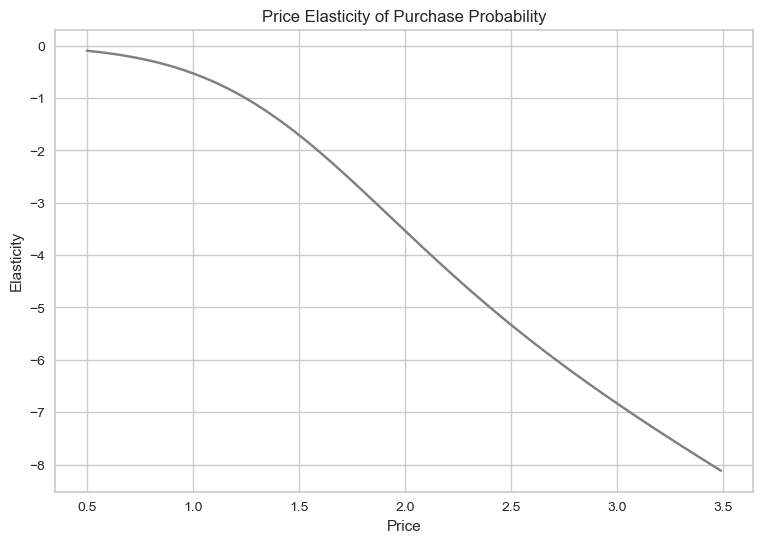

In [120]:
# We display the price elasticity of purchase probability of the average customer.
# We observe that the price elasticities are all negative. Furthermore we can spot where the customer becomes inelastic.
# But to find the precise spot we can consult the price elasticities data frame.
plt.figure(figsize = (9, 6))
plt.plot(price_range, pe, color = 'grey')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

#### Purchase Probability by Segments

#### Segment 0 - Ordinary segment

In [121]:
# Select only customers from segment 0, the Ordinary segment.
df_pa_segment_0 = df_pa[df_pa['Segment'] == 0]
# Prepare dependant and independant variables.
Y = df_pa_segment_0['Incidence']

X = pd.DataFrame()
# Calculate average price for this segment
X['Mean_Price'] = (df_pa_segment_0['Price_1'] + 
                   df_pa_segment_0['Price_2'] + 
                   df_pa_segment_0['Price_3'] + 
                   df_pa_segment_0['Price_4'] + 
                   df_pa_segment_0['Price_5']) / 5
# Logistic regression model
model_incidence_segment0 = LogisticRegression(solver = 'sag')
model_incidence_segment0.fit(X, Y)

model_incidence_segment0.coef_

array([[-1.50828639]])

In [127]:
Y_segment_0 = model_incidence_segment0.predict_proba(df_price_range)
purchase_pr_segment0 = Y_segment_0[:][: , 1]
pe_segment0 = model_incidence_segment0.coef_[:,0] * price_range * (1- purchase_pr_segment0)
df_price_elasticities.insert(2, column = 'PE_Segment_0', value = pe_segment0)

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

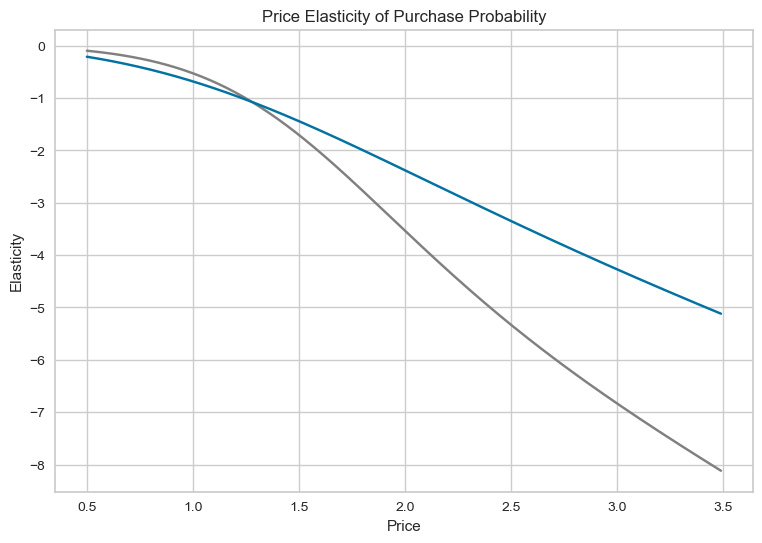

In [128]:
plt.figure(figsize = (9, 6))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment0, color = 'b')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

#### Segment 1 - Ambitious clientele

In [129]:
# We filter the data to contain only customers from segment 1, the Ambitious clientele.
df_pa_segment_1 = df_pa[df_pa['Segment'] == 1]

In [130]:
# Again we want to predict the purchase probability, so our Y variable is the incidence column.
# Only here we select only the customers from the first segment.
Y = df_pa_segment_1['Incidence']

In [131]:
X = pd.DataFrame()

In [132]:
# We calculate the average price for purchases in segment 1. Our dependant variable contains the mean price of the brands.
X['Mean_Price'] = (df_pa_segment_1['Price_1'] + 
                   df_pa_segment_1['Price_2'] + 
                   df_pa_segment_1['Price_3'] + 
                   df_pa_segment_1['Price_4'] + 
                   df_pa_segment_1['Price_5']) / 5

In [133]:
# Fit logistic regression model
model_incidence_segment_1 = LogisticRegression(solver = 'sag')
model_incidence_segment_1.fit(X, Y)

LogisticRegression(solver='sag')

In [134]:
# We observe that the price coefficient for the career focused is -1.7, whereas for the average customer it was -2.35.
# This is an indicator, that this segment is less price sensitive compared to the average customer.
model_incidence_segment_1.coef_

array([[-1.71184169]])

In [135]:
# Calculate Price Elasticity of the Ambitious clientele segment.
Y_segment_1 = model_incidence_segment_1.predict_proba(df_price_range)
purchase_pr_segment_1 = Y_segment_1[:][:, 1]
pe_segment_1 = model_incidence_segment_1.coef_[:, 0] * price_range * (1 - purchase_pr_segment_1)

#### Results

In [136]:
df_price_elasticities['PE_Segment_1'] = pe_segment_1

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

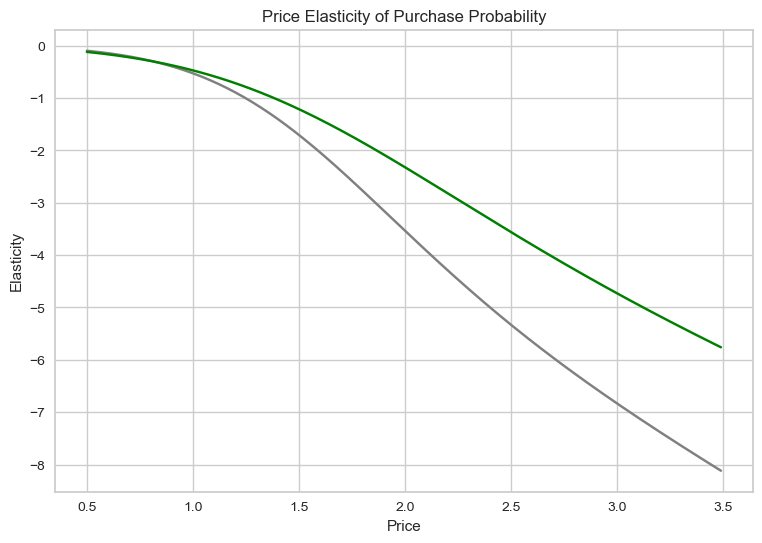

In [137]:
# We plot the elasticities of the average customer and the Ambitious clientele segment side by side. 
# The Ambitious clientele segment is displayed in green. The same color we used during the descriptive analysis.
plt.figure(figsize = (9, 6))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

#### Segment 2 - Marginalized segment

In [138]:
# Select only customers from segment 2, the Marginalized segment.
df_pa_segment_2 = df_pa[df_pa['Segment'] == 2]

In [139]:
# Logistic regression model
Y = df_pa_segment_2['Incidence']

X = pd.DataFrame()
# Calculate average price for this segment
X['Mean_Price'] = (df_pa_segment_2['Price_1'] + 
                   df_pa_segment_2['Price_2'] + 
                   df_pa_segment_2['Price_3'] + 
                   df_pa_segment_2['Price_4'] + 
                   df_pa_segment_2['Price_5']) / 5

model_incidence_segment2 = LogisticRegression(solver = 'sag')
model_incidence_segment2.fit(X, Y)

# Calculate price elasticities
model_incidence_segment2.coef_

array([[-3.63965301]])

In [140]:
Y_segment_2 = model_incidence_segment2.predict_proba(df_price_range)
purchase_pr_segment2 = Y_segment_2[:][: , 1]
pe_segment2 = model_incidence_segment2.coef_[:,0] * price_range * ( 1- purchase_pr_segment2)

#### Results

In [141]:
df_price_elasticities['PE_Segment_2'] = pe_segment2

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

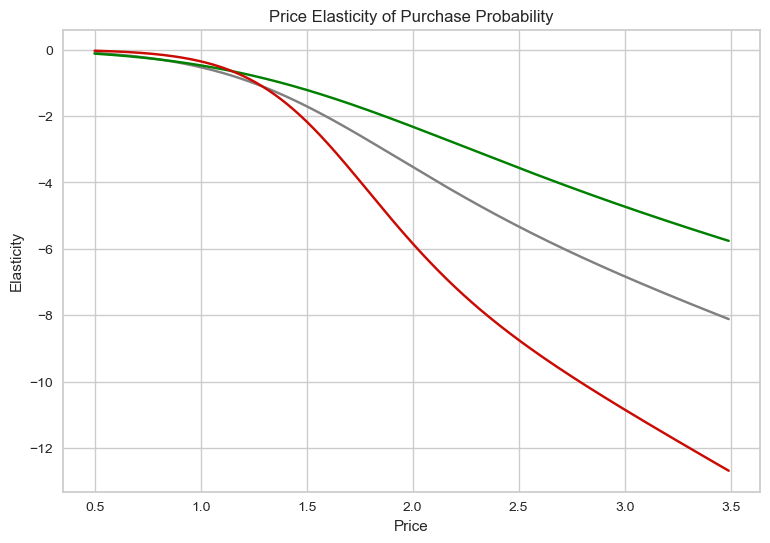

In [142]:
plt.figure(figsize = (9, 6))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.plot(price_range, pe_segment2, color = 'r')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

#### Segment 3 - Prosperous segment

In [143]:
# Select only customers from segment 3 
df_pa_segment_3 = df_pa[df_pa['Segment'] == 3]
# Prepare dependant and independant variables.
Y = df_pa_segment_3['Incidence']

X = pd.DataFrame()
# Calculate average price for this segment
X['Mean_Price'] = (df_pa_segment_3['Price_1'] + 
                   df_pa_segment_3['Price_2'] + 
                   df_pa_segment_3['Price_3'] + 
                   df_pa_segment_3['Price_4'] + 
                   df_pa_segment_3['Price_5']) / 5
# Logistic regression model
model_incidence_segment3 = LogisticRegression(solver = 'sag')
model_incidence_segment3.fit(X, Y)

model_incidence_segment3.coef_
Y_segment_3 = model_incidence_segment2.predict_proba(df_price_range)
purchase_pr_segment3 = Y_segment_3[:][: , 1]
pe_segment3 = model_incidence_segment3.coef_[:,0] * price_range *( 1- purchase_pr_segment3)
df_price_elasticities['PE_Segment_3'] = pe_segment3
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_0,PE_Segment_1,PE_Segment_2,PE_Segment_3
0,0.50,-0.096453,-0.211181,-0.119076,-0.030920,-0.010587
1,0.51,-0.100525,-0.217751,-0.123258,-0.032687,-0.011192
2,0.52,-0.104724,-0.224429,-0.127534,-0.034540,-0.011827
3,0.53,-0.109053,-0.231216,-0.131905,-0.036485,-0.012493
4,0.54,-0.113515,-0.238112,-0.136372,-0.038524,-0.013191
5,0.55,-0.118115,-0.245118,-0.140936,-0.040662,-0.013923
6,0.56,-0.122854,-0.252235,-0.145600,-0.042904,-0.014691
7,0.57,-0.127737,-0.259463,-0.150364,-0.045254,-0.015495
8,0.58,-0.132767,-0.266804,-0.155231,-0.047716,-0.016339
9,0.59,-0.137947,-0.274258,-0.160201,-0.050295,-0.017222


#### Results

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

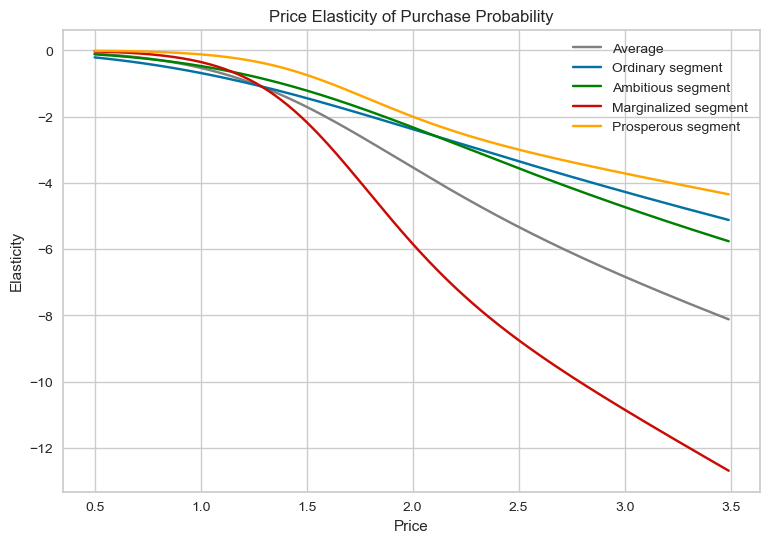

In [144]:
# We display all elasticities of purchase probability on the same plot. 
# We observe that the Ambitious clientele segment are the least elastic when compared to the rest. 
# So, their purchase probability elasticity is not as affected by price.
# The price elasticities for the Ordinary segment seem to differ across price range. This may be due to the fact that
# the Ordinary segment is least homogenous, which we discovered during our descriptive analysis. 
# It may be that the customers in this segment have different shopping habbits, which is why their 
# customers start with being more elastic than average but then shift to being more inelastic than the average customer
# and indeed the Ambitious clientele segment.
plt.figure(figsize = (9, 6))
plt.plot(price_range, pe, color = 'grey', label = 'Average')
plt.plot(price_range, pe_segment0, color = 'b', label='Ordinary segment')
plt.plot(price_range, pe_segment_1, color = 'green', label= 'Ambitious segment')
plt.plot(price_range, pe_segment2, color = 'r', label= 'Marginalized segment')
plt.plot(price_range, pe_segment3, color = 'orange', label= 'Prosperous segment')
plt.legend()
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

#### Purchase Probability with Promotion Feature

#### Data Preparation

In [145]:
Y = df_pa['Incidence']

In [146]:
X = pd.DataFrame()
X['Mean_Price'] = (df_pa['Price_1'] + 
                   df_pa['Price_2'] + 
                   df_pa['Price_3'] + 
                   df_pa['Price_4'] + 
                   df_pa['Price_5']) / 5

In [147]:
# We include a second promotion feature. We'd like to examine the effects of promotions on purchase probability.
# We calculate the average promotion rate across the five brands. We add the mean price for the brands.
X['Mean_Promotion'] = (df_pa['Promotion_1'] +
                       df_pa['Promotion_2'] +
                       df_pa['Promotion_3'] +
                       df_pa['Promotion_4'] +
                       df_pa['Promotion_5'] ) / 5
X.head()

,Mean_Price,Mean_Promotion
0,2.044,0.2
1,2.028,0.0
2,2.028,0.0
3,2.028,0.0
4,2.030,0.0


#### Model Estimation

In [148]:
# The coefficient for promotion is positive. 
# Therefore, there is a positive relationship between promotion and purchase probability.
model_incidence_promotion = LogisticRegression(solver = 'sag')
model_incidence_promotion.fit(X, Y)
model_incidence_promotion.coef_

array([[-1.49402073,  0.56146774]])

#### Price Elasticity with Promotion

In [155]:
# We create a data frame on which our model will predict. We need to include A price and promotion feature.
# First, we'll include the price range as the price feature. Next, we'll include the promotion feature.
# We'll calculate price elasticities of purchase probability when we assume there is a promotion across at each price points.
# Purchase Probability with Promotion Model Prediction
# Update master data to include elasticities of purchase probability with promotion feature

In [152]:
df_price_elasticity_promotion = pd.DataFrame(price_range)
df_price_elasticity_promotion = df_price_elasticity_promotion.rename(columns={0: "Mean_Price"})

In [153]:
df_price_elasticity_promotion['Mean_Promotion'] = 1  # Assuming a default promotion value of 1 for all rows

# Ensure all features are present
X_new = df_price_elasticity_promotion[['Mean_Price', 'Mean_Promotion']]

# Now predict using the updated data
Y_promotion = model_incidence_promotion.predict_proba(X_new)

promo = Y_promotion[:, 1]
price_elasticity_promo = (model_incidence_promotion.coef_[:, 0] * price_range) * (1 - promo)

In [154]:
df_price_elasticities['Elasticity_Promotion_1'] = price_elasticity_promo
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_0,PE_Segment_1,PE_Segment_2,PE_Segment_3,Elasticity_Promotion_1
0,0.50,-0.096453,-0.211181,-0.119076,-0.030920,-0.010587,-0.125745
1,0.51,-0.100525,-0.217751,-0.123258,-0.032687,-0.011192,-0.129861
2,0.52,-0.104724,-0.224429,-0.127534,-0.034540,-0.011827,-0.134057
3,0.53,-0.109053,-0.231216,-0.131905,-0.036485,-0.012493,-0.138332
4,0.54,-0.113515,-0.238112,-0.136372,-0.038524,-0.013191,-0.142688
5,0.55,-0.118115,-0.245118,-0.140936,-0.040662,-0.013923,-0.147127
6,0.56,-0.122854,-0.252235,-0.145600,-0.042904,-0.014691,-0.151648
7,0.57,-0.127737,-0.259463,-0.150364,-0.045254,-0.015495,-0.156253
8,0.58,-0.132767,-0.266804,-0.155231,-0.047716,-0.016339,-0.160943
9,0.59,-0.137947,-0.274258,-0.160201,-0.050295,-0.017222,-0.165719


#### Price Elasticity without Promotion

In [ ]:
# Promotion feature - No Promotion.
# We assume there aren't any promotional activities on any of the price points.
# We examine the elasticity of purchase probability when there isn't promotion.
# Purchase Probability without Promotion Model Prediction
# Update master data frame to include purchase probability elasticities without promotion.
# We can now see the values with and without promotion and compare them for each price point in our price range.

In [159]:
# Create a DataFrame with the required features
df_price_elasticity_promotion_no = pd.DataFrame(price_range)
df_price_elasticity_promotion_no = df_price_elasticity_promotion_no.rename(columns={0: "Mean_Price"})

df_price_elasticity_promotion_no['Mean_Promotion'] = 0  # Assuming a default promotion value of 0 for all rows

# Ensure all features are present
X_no_promo = df_price_elasticity_promotion_no[['Mean_Price', 'Mean_Promotion']]

# Now predict using the updated data
Y_no_promo = model_incidence_promotion.predict_proba(X_no_promo)

no_promo = Y_no_promo[:, 1]

# Calculate price elasticity
price_elasticity_no_promo = model_incidence_promotion.coef_[:, 0] * price_range * (1 - no_promo)

# Update the DataFrame with the new price elasticity
df_price_elasticities['Elasticity_Promotion_0'] = price_elasticity_no_promo

In [160]:
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_0,PE_Segment_1,PE_Segment_2,PE_Segment_3,Elasticity_Promotion_1,Elasticity_Promotion_0
0,0.50,-0.096453,-0.211181,-0.119076,-0.030920,-0.010587,-0.125745,-0.195653
1,0.51,-0.100525,-0.217751,-0.123258,-0.032687,-0.011192,-0.129861,-0.201775
2,0.52,-0.104724,-0.224429,-0.127534,-0.034540,-0.011827,-0.134057,-0.207999
3,0.53,-0.109053,-0.231216,-0.131905,-0.036485,-0.012493,-0.138332,-0.214326
4,0.54,-0.113515,-0.238112,-0.136372,-0.038524,-0.013191,-0.142688,-0.220758
5,0.55,-0.118115,-0.245118,-0.140936,-0.040662,-0.013923,-0.147127,-0.227294
6,0.56,-0.122854,-0.252235,-0.145600,-0.042904,-0.014691,-0.151648,-0.233936
7,0.57,-0.127737,-0.259463,-0.150364,-0.045254,-0.015495,-0.156253,-0.240685
8,0.58,-0.132767,-0.266804,-0.155231,-0.047716,-0.016339,-0.160943,-0.247541
9,0.59,-0.137947,-0.274258,-0.160201,-0.050295,-0.017222,-0.165719,-0.254505


Text(0.5, 1.0, 'Price Elasticity of Purchase Probability with and without Promotion')

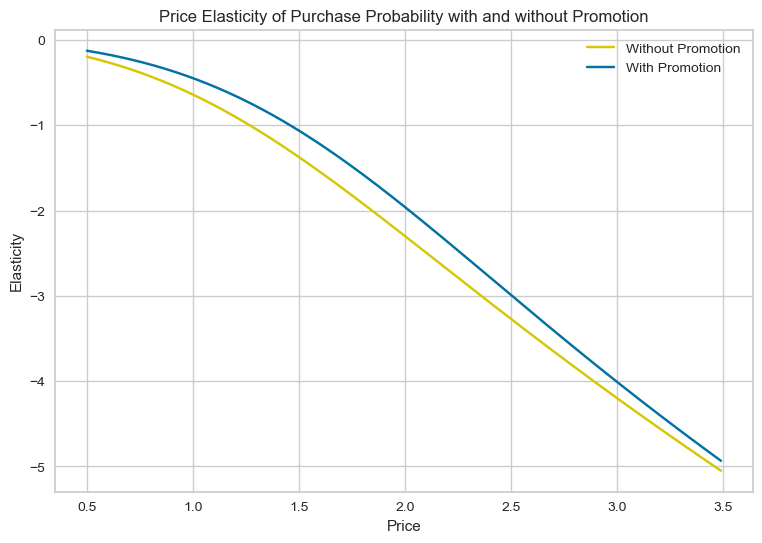

In [225]:
# Plot purchase elasticities with and without promotion side by side for comprarisson.
# Here we observe that the purchase probability elasticity of the customer is less elastic when there is promotion.
# This is an important insight for marketers, as according to our model people are more likely to buy a product if there is
# some promotional activity rather than purchase a product with the same price, when it isn't on promotion. 
plt.figure(figsize = (9, 6))
plt.plot(price_range, price_elasticity_no_promo, color = 'y', label = 'Without Promotion')
plt.plot(price_range, price_elasticity_promo, color = 'b', label = 'With Promotion')
plt.legend()
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability with and without Promotion')

#### Brand Choice

#### Data Preparation

In [162]:
# Here we are interested in determining the brand choice of the customer. 
# Hence, we filter our data, to include only purchase occasion, when a purchase has occured. 
brand_choice = df_pa[df_pa['Incidence'] == 1]

In [163]:
# We cap the maximum displayed rows in a table, to make computation more efficient and easier readability.
pd.options.display.max_rows = 100
brand_choice

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,Price_5,Promotion_1,Promotion_2,Promotion_3,Promotion_4,Promotion_5,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,2.09,2.67,0,0,0,0,0,0,0,47,1,110866,1,0,2,0,0,1,0
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,2.12,2.62,1,0,0,0,1,0,0,47,1,110866,1,0,2,0,0,1,0
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,1.97,2.67,0,0,0,1,0,0,0,47,1,110866,1,0,2,0,0,1,0
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,2.16,2.68,1,1,0,0,0,0,0,47,1,110866,1,0,2,0,0,1,0
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,1.89,2.37,1,0,0,1,1,0,0,47,1,110866,1,0,2,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58621,200000500,296,1,2,6,0,0,1.48,1.89,2.01,2.18,2.69,0,0,0,0,0,0,0,42,1,120946,1,0,2,0,0,1,0
58648,200000500,460,1,1,12,0,0,1.35,1.57,2.02,2.21,2.70,1,1,0,0,0,0,0,42,1,120946,1,0,2,0,0,1,0
58674,200000500,641,1,2,7,0,0,1.50,1.85,2.06,2.24,2.79,1,1,0,0,0,0,0,42,1,120946,1,0,2,0,0,1,0
58687,200000500,697,1,2,6,0,0,1.42,1.51,1.97,2.24,2.78,0,0,0,0,0,0,0,42,1,120946,1,0,2,0,0,1,0


In [164]:
# Our model will predict the brand.
Y = brand_choice['Brand']

In [165]:
# Here we decide which features to include for prediction.
brand_choice.columns.values

array(['ID', 'Day', 'Incidence', 'Brand', 'Quantity', 'Last_Inc_Brand',
       'Last_Inc_Quantity', 'Price_1', 'Price_2', 'Price_3', 'Price_4',
       'Price_5', 'Promotion_1', 'Promotion_2', 'Promotion_3',
       'Promotion_4', 'Promotion_5', 'Sex', 'Marital status', 'Age',
       'Education', 'Income', 'Occupation', 'Settlement size', 'Segment',
       'Segment_0', 'Segment_1', 'Segment_2', 'Segment_3'], dtype=object)

In [166]:
# We predict based on the prices for the five brands.
features = ['Price_1', 'Price_2', 'Price_3', 'Price_4', 'Price_5']
X = brand_choice[features]

In [167]:
# Brand Choice Model fit.
model_brand_choice = LogisticRegression(solver = 'sag', multi_class = 'multinomial')
model_brand_choice.fit(X, Y)

LogisticRegression(multi_class='multinomial', solver='sag')

In [168]:
# Here are the coeffictients for the model. We have five brands and five features for the price. 
# Therefore, this output is somewhat difficult to read.
model_brand_choice.coef_

array([[-3.91594651,  0.65845977,  2.41776003,  0.70409267, -0.20209695],
       [ 1.27461619, -1.8798553 , -0.21263474, -0.20633789,  0.58787398],
       [ 1.62416508,  0.56210773,  0.50081138,  1.03949072,  0.45276425],
       [ 0.57454169,  0.39558859, -1.40059596, -1.24624081,  0.2493547 ],
       [ 0.44262355,  0.2636992 , -1.30534072, -0.29100469, -1.08789598]])

In [169]:
# We create a pandas data frame, which contains to coefficients.
bc_coef = pd.DataFrame(model_brand_choice.coef_)
bc_coef

,0,1,2,3,4
0,-3.915947,0.658460,2.417760,0.704093,-0.202097
1,1.274616,-1.879855,-0.212635,-0.206338,0.587874
2,1.624165,0.562108,0.500811,1.039491,0.452764
3,0.574542,0.395589,-1.400596,-1.246241,0.249355
4,0.442624,0.263699,-1.305341,-0.291005,-1.087896


In [170]:
# We make some transformations on the coefficients data frame to increase readability.
# We transpose the data frame, to keep with the conventional representation of results.
# We add labels for the columns and the index, which represent the coefficients of the brands and prices, respectively. 
bc_coef = pd.DataFrame(np.transpose(model_brand_choice.coef_))
coefficients = ['Coef_Brand_1', 'Coef_Brand_2', 'Coef_Brand_3', 'Coef_Brand_4', 'Coef_Brand_5']
bc_coef.columns = [coefficients]
prices = ['Price_1', 'Price_2', 'Price_3', 'Price_4', 'Price_5']
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)
bc_coef

,Coef_Brand_1,Coef_Brand_2,Coef_Brand_3,Coef_Brand_4,Coef_Brand_5
Price_1,-3.92,1.27,1.62,0.57,0.44
Price_2,0.66,-1.88,0.56,0.40,0.26
Price_3,2.42,-0.21,0.50,-1.40,-1.31
Price_4,0.70,-0.21,1.04,-1.25,-0.29
Price_5,-0.20,0.59,0.45,0.25,-1.09


#### Own Price Elasticity Brand 5

In [171]:
# We want to calculate price elasticity of brand choice.
# Here we create a data frame with price columns, which our model will use to predict the brand choice probabilities.
df_own_brand_5 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5['Price_1'] = brand_choice['Price_1'].mean()
df_own_brand_5['Price_2'] = brand_choice['Price_2'].mean()
df_own_brand_5['Price_3'] = brand_choice['Price_3'].mean()
df_own_brand_5['Price_4'] = brand_choice['Price_4'].mean()
df_own_brand_5['Price_5'] = price_range
df_own_brand_5

,Price_1,Price_2,Price_3,Price_4,Price_5
0,1.384559,1.764717,2.006694,2.159658,0.50
1,1.384559,1.764717,2.006694,2.159658,0.51
2,1.384559,1.764717,2.006694,2.159658,0.52
3,1.384559,1.764717,2.006694,2.159658,0.53
4,1.384559,1.764717,2.006694,2.159658,0.54
...,...,...,...,...,...
295,1.384559,1.764717,2.006694,2.159658,3.45
296,1.384559,1.764717,2.006694,2.159658,3.46
297,1.384559,1.764717,2.006694,2.159658,3.47
298,1.384559,1.764717,2.006694,2.159658,3.48


In [172]:
# Brand Choice Model prediction.
predict_brand_5 = model_brand_choice.predict_proba(df_own_brand_5)

In [173]:
# Our model returns the probabilities of choosing each of the 5 brands. 
# Since, we are interested in the probability for the fifth brand we need to obtain the last column located on position 4,
# as we're starting to count from 0.
pr_own_brand_5 = predict_brand_5[: ][:, 4]

In [174]:
# We're interested in choosing brand 5. 
# Therefore, the beta coefficient we require is that of the brand 5 coefficient and price 5.
beta5 = bc_coef.iloc[4, 4]
beta5

-1.09

In [175]:
# Calculating price elasticities for brand choice without promotion. 
own_price_elasticity_brand_5 = beta5 * price_range * (1 - pr_own_brand_5)

In [176]:
# Adding the price elasticities to our master data frame. 
df_price_elasticities['Brand_5'] = own_price_elasticity_brand_5
pd.options.display.max_rows = None
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_0,PE_Segment_1,PE_Segment_2,PE_Segment_3,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5
0,0.50,-0.096453,-0.211181,-0.119076,-0.030920,-0.010587,-0.125745,-0.195653,-0.049055
1,0.51,-0.100525,-0.217751,-0.123258,-0.032687,-0.011192,-0.129861,-0.201775,-0.050616
2,0.52,-0.104724,-0.224429,-0.127534,-0.034540,-0.011827,-0.134057,-0.207999,-0.052206
3,0.53,-0.109053,-0.231216,-0.131905,-0.036485,-0.012493,-0.138332,-0.214326,-0.053827
4,0.54,-0.113515,-0.238112,-0.136372,-0.038524,-0.013191,-0.142688,-0.220758,-0.055477
5,0.55,-0.118115,-0.245118,-0.140936,-0.040662,-0.013923,-0.147127,-0.227294,-0.057158
6,0.56,-0.122854,-0.252235,-0.145600,-0.042904,-0.014691,-0.151648,-0.233936,-0.058870
7,0.57,-0.127737,-0.259463,-0.150364,-0.045254,-0.015495,-0.156253,-0.240685,-0.060614
8,0.58,-0.132767,-0.266804,-0.155231,-0.047716,-0.016339,-0.160943,-0.247541,-0.062390
9,0.59,-0.137947,-0.274258,-0.160201,-0.050295,-0.017222,-0.165719,-0.254505,-0.064199


Text(0.5, 1.0, 'Own Price Elasticity of Purchase Probability for Brand 5')

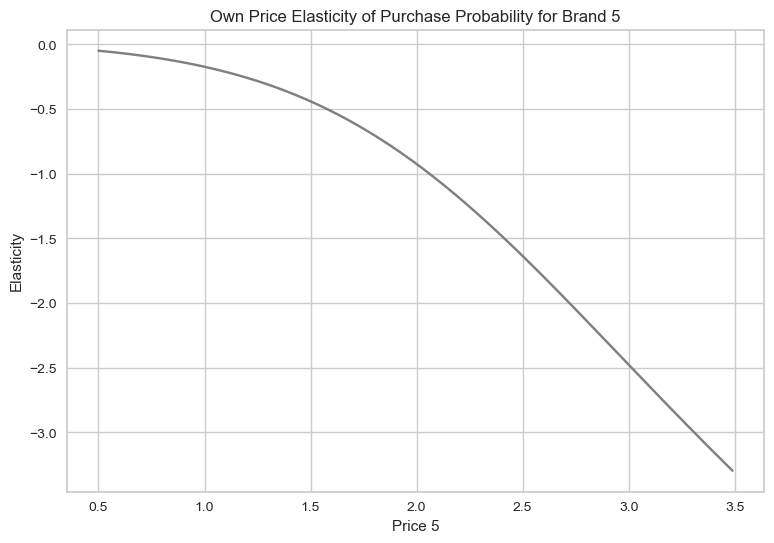

In [177]:
# Plot elasticities of purchase probability for brand 5.
plt.figure(figsize = (9, 6))
plt.plot(price_range, own_price_elasticity_brand_5, color = 'grey')
plt.xlabel('Price 5')
plt.ylabel('Elasticity')
plt.title('Own Price Elasticity of Purchase Probability for Brand 5')

#### Cross Price Elasticiy Brand 5, Cross Brand 4

In [178]:
# We want to examine the effect of the changes in price of a competitor brand.
# As we've discussed in the lecture, the brand which comes closest to our own brand is brand 4. 
# Therefore, we need to examine changes in the price of this brand.
# Keep in mind, we could examine the cross price elasticities for any of the remaining brands, 
# we just need to update this data frame accordingly to contain the respective brand.
df_brand5_cross_brand4 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4['Price_1'] = brand_choice['Price_1'].mean()
df_brand5_cross_brand4['Price_2'] = brand_choice['Price_2'].mean()
df_brand5_cross_brand4['Price_3'] = brand_choice['Price_3'].mean()
df_brand5_cross_brand4['Price_4'] = price_range
df_brand5_cross_brand4['Price_5'] = brand_choice['Price_5'].mean()

In [179]:
df_brand5_cross_brand4.head()

,Price_1,Price_2,Price_3,Price_4,Price_5
0,1.384559,1.764717,2.006694,0.50,2.654296
1,1.384559,1.764717,2.006694,0.51,2.654296
2,1.384559,1.764717,2.006694,0.52,2.654296
3,1.384559,1.764717,2.006694,0.53,2.654296
4,1.384559,1.764717,2.006694,0.54,2.654296


In [180]:
predict_brand5_cross_brand4 = model_brand_choice.predict_proba(df_brand5_cross_brand4)

In [181]:
# As now we're interested in what the probability of choosing the competitor brand is, 
# we need to select the purchase probability for brand 4, contained in the 4th column with index 3. 
pr_brand_4 = predict_brand5_cross_brand4[:][:, 3]

In [182]:
beta5

-1.09

In [183]:
# In order to calculate the cross brand price elasticity, we need to use the new formula we introduced in the lecture.
# The elasticity is equal to negative the price coefficient of the own brand multiplied by the price of the cross brand,
# further multiplied by the probability for choosing the cross brand.
brand5_cross_brand4_price_elasticity = -beta5 * price_range * pr_brand_4

In [184]:
# Update price elasticities data frame to include the cross price elasticities for brand 5 with respect to brand 4.
df_price_elasticities['Brand_5_Cross_Brand_4'] = brand5_cross_brand4_price_elasticity
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_0,PE_Segment_1,PE_Segment_2,PE_Segment_3,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4
0,0.50,-0.096453,-0.211181,-0.119076,-0.030920,-0.010587,-0.125745,-0.195653,-0.049055,0.332011
1,0.51,-0.100525,-0.217751,-0.123258,-0.032687,-0.011192,-0.129861,-0.201775,-0.050616,0.337287
2,0.52,-0.104724,-0.224429,-0.127534,-0.034540,-0.011827,-0.134057,-0.207999,-0.052206,0.342507
3,0.53,-0.109053,-0.231216,-0.131905,-0.036485,-0.012493,-0.138332,-0.214326,-0.053827,0.347669
4,0.54,-0.113515,-0.238112,-0.136372,-0.038524,-0.013191,-0.142688,-0.220758,-0.055477,0.352773
5,0.55,-0.118115,-0.245118,-0.140936,-0.040662,-0.013923,-0.147127,-0.227294,-0.057158,0.357820
6,0.56,-0.122854,-0.252235,-0.145600,-0.042904,-0.014691,-0.151648,-0.233936,-0.058870,0.362809
7,0.57,-0.127737,-0.259463,-0.150364,-0.045254,-0.015495,-0.156253,-0.240685,-0.060614,0.367741
8,0.58,-0.132767,-0.266804,-0.155231,-0.047716,-0.016339,-0.160943,-0.247541,-0.062390,0.372614
9,0.59,-0.137947,-0.274258,-0.160201,-0.050295,-0.017222,-0.165719,-0.254505,-0.064199,0.377430


Text(0.5, 1.0, 'Cross Price Elasticity of Brand 5 wrt Brand 4')

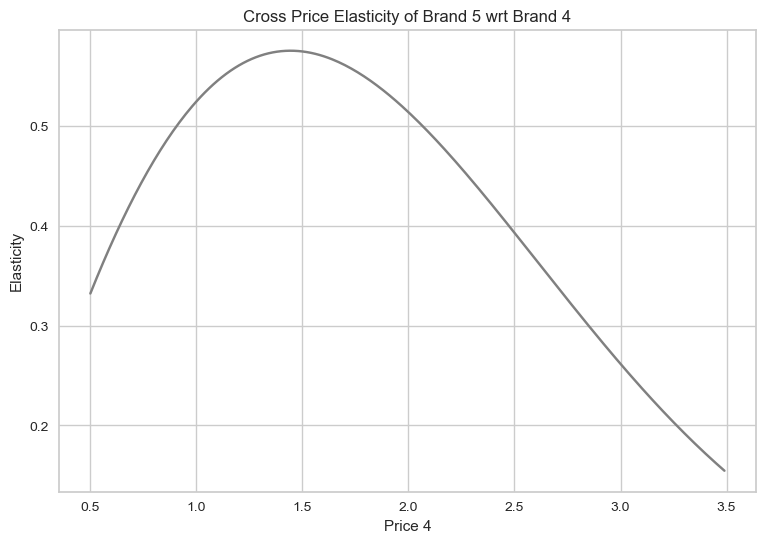

In [185]:
# Here we examine the cross price elasticity of purchase probability for brand 5 with respect to brand 4.
# We observe they are positive. As the price of the competitor brand increases, 
# so does the probability for purchasing our own brand.
# Even though the elasticity starts to decrease from the 1.45 mark, it is still positive, 
# signalling that the increase in purchase probability for the own brand happens more slowly.
plt.figure(figsize = (9, 6))
plt.plot(price_range, brand5_cross_brand4_price_elasticity, color = 'grey')
plt.xlabel('Price 4')
plt.ylabel('Elasticity')
plt.title('Cross Price Elasticity of Brand 5 wrt Brand 4')

#### Own and Cross-Price Elasticity by Segment

#### Prosperous segment

In [186]:
# We are interested in analysing the purchase probability for choosing brand 5 by segments.
# We filter our data to contain only purchase incidences of the third segment - Prosperous segment.
brand_choice_s3 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s3 = brand_choice_s3[brand_choice_s3['Segment'] == 3]

pd.options.display.max_rows = 100
brand_choice_s3

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,Price_5,Promotion_1,Promotion_2,Promotion_3,Promotion_4,Promotion_5,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
101,200000002,6,1,4,1,0,0,1.59,1.87,2.01,2.09,2.66,0,0,0,0,0,1,1,52,2,159052,2,1,3,0,0,0,1
115,200000002,100,1,4,2,0,0,1.47,1.90,1.95,2.12,2.67,0,0,0,1,0,1,1,52,2,159052,2,1,3,0,0,0,1
138,200000002,283,1,4,3,0,0,1.37,1.89,2.00,2.14,2.64,0,0,0,0,0,1,1,52,2,159052,2,1,3,0,0,0,1
141,200000002,307,1,4,1,0,0,1.34,1.89,2.01,2.03,2.68,1,0,0,1,0,1,1,52,2,159052,2,1,3,0,0,0,1
153,200000002,422,1,4,1,0,0,1.34,1.89,2.02,2.21,2.65,0,0,0,1,0,1,1,52,2,159052,2,1,3,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57346,200000489,687,1,4,1,4,1,1.50,1.87,2.06,2.24,2.78,0,0,0,0,0,1,1,44,2,193816,2,1,3,0,0,0,1
57347,200000489,693,1,4,2,4,1,1.42,1.51,2.02,2.24,2.77,0,1,0,0,0,1,1,44,2,193816,2,1,3,0,0,0,1
57348,200000489,701,1,4,3,4,1,1.42,1.85,1.99,2.24,2.76,0,0,1,0,0,1,1,44,2,193816,2,1,3,0,0,0,1
57350,200000489,715,1,4,2,0,0,1.50,1.80,2.09,2.24,2.79,0,0,0,0,0,1,1,44,2,193816,2,1,3,0,0,0,1


In [187]:
# Brand Choice Model estimation.
Y = brand_choice_s3['Brand']
brand_choice_s3 = pd.get_dummies(brand_choice_s3, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s3[features]
model_brand_choice_s3 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s3.fit(X, Y)

# Coefficients table for segment 3
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s3.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)
bc_coef

,Coef_Brand_1,Coef_Brand_2,Coef_Brand_3,Coef_Brand_4,Coef_Brand_5
Price_1,-2.15,1.33,0.82,0.12,-0.11
Price_2,-0.96,-1.38,1.29,0.78,0.27
Price_3,2.01,-1.65,-0.49,0.03,0.11
Price_4,2.52,0.96,-0.25,-1.90,-1.33
Price_5,-0.99,-0.30,1.17,0.56,-0.44


#### Own-Brand Price Elasticity

In [188]:
# Calculating own-brand price elasticity for brand 5 and the Prosperous segment.
df_own_brand_5_s3 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s3['Price_1'] = brand_choice_s3['Price_1'].mean()
df_own_brand_5_s3['Price_2'] = brand_choice_s3['Price_2'].mean()
df_own_brand_5_s3['Price_3'] = brand_choice_s3['Price_3'].mean()
df_own_brand_5_s3['Price_4'] = brand_choice_s3['Price_4'].mean()
df_own_brand_5_s3['Price_5'] = price_range

predict_own_brand_5_s3 = model_brand_choice_s3.predict_proba(df_own_brand_5_s3)
pr_own_brand_5_s3 = predict_own_brand_5_s3[: ][: , 4]

own_price_elasticity_brand_5_s3 =  beta5 * price_range * (1 - pr_own_brand_5_s3)
df_price_elasticities['Brand 5 S3'] = own_price_elasticity_brand_5_s3

#### Cross-Brand Price Elasticity

In [189]:
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Prosperous segment.
df_brand5_cross_brand4_s3 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s3['Price_1'] = brand_choice_s3['Price_1'].mean()
df_brand5_cross_brand4_s3['Price_2'] = brand_choice_s3['Price_2'].mean()
df_brand5_cross_brand4_s3['Price_3'] = brand_choice_s3['Price_3'].mean()
df_brand5_cross_brand4_s3['Price_4'] = price_range
df_brand5_cross_brand4_s3['Price_5'] = brand_choice_s3['Price_5'].mean()

predict_brand5_cross_brand4_s3 = model_brand_choice_s3.predict_proba(df_brand5_cross_brand4_s3)
pr_cross_brand_5_s3 = predict_brand5_cross_brand4_s3[: ][: , 3]

# Update master data frame to include the newly obtained cross-brand price elasticities.
brand5_cross_brand4_price_elasticity_s3 = -beta5 * price_range * pr_cross_brand_5_s3
df_price_elasticities['Brand_5_Cross_Brand_4_S3'] = brand5_cross_brand4_price_elasticity_s3
pd.options.display.max_rows = None
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_0,PE_Segment_1,PE_Segment_2,PE_Segment_3,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S3,Brand_5_Cross_Brand_4_S3
0,0.50,-0.096453,-0.211181,-0.119076,-0.030920,-0.010587,-0.125745,-0.195653,-0.049055,0.332011,-0.297341,0.482421
1,0.51,-0.100525,-0.217751,-0.123258,-0.032687,-0.011192,-0.129861,-0.201775,-0.050616,0.337287,-0.303387,0.491726
2,0.52,-0.104724,-0.224429,-0.127534,-0.034540,-0.011827,-0.134057,-0.207999,-0.052206,0.342507,-0.309443,0.501016
3,0.53,-0.109053,-0.231216,-0.131905,-0.036485,-0.012493,-0.138332,-0.214326,-0.053827,0.347669,-0.315511,0.510290
4,0.54,-0.113515,-0.238112,-0.136372,-0.038524,-0.013191,-0.142688,-0.220758,-0.055477,0.352773,-0.321589,0.519548
5,0.55,-0.118115,-0.245118,-0.140936,-0.040662,-0.013923,-0.147127,-0.227294,-0.057158,0.357820,-0.327679,0.528791
6,0.56,-0.122854,-0.252235,-0.145600,-0.042904,-0.014691,-0.151648,-0.233936,-0.058870,0.362809,-0.333780,0.538017
7,0.57,-0.127737,-0.259463,-0.150364,-0.045254,-0.015495,-0.156253,-0.240685,-0.060614,0.367741,-0.339894,0.547227
8,0.58,-0.132767,-0.266804,-0.155231,-0.047716,-0.016339,-0.160943,-0.247541,-0.062390,0.372614,-0.346020,0.556421
9,0.59,-0.137947,-0.274258,-0.160201,-0.050295,-0.017222,-0.165719,-0.254505,-0.064199,0.377430,-0.352160,0.565598


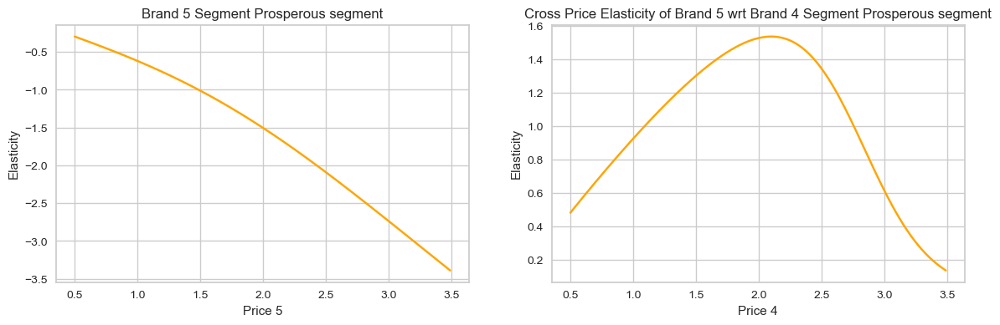

In [190]:
# Using a figure with axes we plot the own brand and cross-brand price elasticities for brand 5 cross brand 4 side by side.
fig, axs = plt.subplots(1, 2, figsize = (14, 4))
axs[0].plot(price_range, own_price_elasticity_brand_5_s3, color = 'orange')
axs[0].set_title('Brand 5 Segment Prosperous segment')
axs[0].set_xlabel('Price 5')

axs[1].plot(price_range, brand5_cross_brand4_price_elasticity_s3, color = 'orange')
axs[1].set_title('Cross Price Elasticity of Brand 5 wrt Brand 4 Segment Prosperous segment')
axs[1].set_xlabel('Price 4')

for ax in axs.flat:
    ax.set(ylabel = 'Elasticity')

#### Ordinary segment

In [191]:
# Here we are interesting in analysing the brand choice probability of the Ordinary segment.
# We filter our data, by selecting only purchases from segment 0.
brand_choice_s0 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s0 = brand_choice_s0[brand_choice_s0['Segment'] == 0]
brand_choice_s0.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,Price_5,Promotion_1,Promotion_2,Promotion_3,Promotion_4,Promotion_5,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
2398,200000024,44,1,2,2,0,0,1.35,1.58,1.97,2.09,2.67,1,1,1,0,0,1,1,32,1,88428,0,0,0,1,0,0,0
2403,200000024,98,1,2,2,0,0,1.47,1.90,1.95,2.12,2.67,0,0,0,0,0,1,1,32,1,88428,0,0,0,1,0,0,0
2408,200000024,143,1,2,3,0,0,1.21,1.35,1.99,2.16,2.67,1,1,0,0,0,1,1,32,1,88428,0,0,0,1,0,0,0
2410,200000024,162,1,2,5,0,0,1.39,1.90,1.94,2.16,2.49,1,0,0,0,0,1,1,32,1,88428,0,0,0,1,0,0,0
2417,200000024,217,1,5,1,0,0,1.34,1.89,1.99,2.13,2.67,0,0,0,0,0,1,1,32,1,88428,0,0,0,1,0,0,0


In [192]:
# Brand Choice Model estimation.
Y = brand_choice_s0['Brand']
brand_choice_s0 = pd.get_dummies(brand_choice_s0, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s0[features]
model_brand_choice_s0 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 200)
model_brand_choice_s0.fit(X, Y)

# Coefficients table segment 0.
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s0.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)

#### Own-Brand Price Elasticity

In [193]:
# Calculating own-brand price elasticity for brand 5 and the Ordinary segment.
df_own_brand_5_s0 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s0['Price_1'] = brand_choice_s0['Price_1'].mean()
df_own_brand_5_s0['Price_2'] = brand_choice_s0['Price_2'].mean()
df_own_brand_5_s0['Price_3'] = brand_choice_s0['Price_3'].mean()
df_own_brand_5_s0['Price_4'] = brand_choice_s0['Price_4'].mean()
df_own_brand_5_s0['Price_5'] = price_range

predict_own_brand_5_s0 = model_brand_choice_s0.predict_proba(df_own_brand_5_s0)
pr_own_brand_5_s0 = predict_own_brand_5_s0[: ][: , 4]

# Compute price elasticities and update master data frame.
# We'd like to include the elasticities for the segments in order from 0 to three, which is why we use insert() on position 10.
own_price_elasticity_brand_5_s0 =  beta5 * price_range * (1 - pr_own_brand_5_s0)
df_price_elasticities.insert(10, column = 'Brand 5 S0', value = own_price_elasticity_brand_5_s0)

#### Cross-Brand Price Elasticity

In [194]:
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Ordinary segment.
df_brand5_cross_brand4_s0 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s0['Price_1'] = brand_choice_s0['Price_1'].mean()
df_brand5_cross_brand4_s0['Price_2'] = brand_choice_s0['Price_2'].mean()
df_brand5_cross_brand4_s0['Price_3'] = brand_choice_s0['Price_3'].mean()
df_brand5_cross_brand4_s0['Price_4'] = price_range
df_brand5_cross_brand4_s0['Price_5'] = brand_choice_s0['Price_5'].mean()

predict_brand5_cross_brand4_s0 = model_brand_choice_s0.predict_proba(df_brand5_cross_brand4_s0)
pr_cross_brand_5_s0 = predict_brand5_cross_brand4_s0[: ][: , 3]

# Compute price elasticities and update master data frame.
# We need to use insert() on position 11, to save the price elasticities in the correct order.
brand5_cross_brand4_price_elasticity_s0 = -beta5 * price_range * pr_cross_brand_5_s0
df_price_elasticities.insert(11, column = 'Brand_5_Cross_Brand_4_S0', value = brand5_cross_brand4_price_elasticity_s0)

#### Ambitious clientele

In [195]:
# Filter data by the Ambitious clientele segment, which is the first segment.
brand_choice_s1 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s1 = brand_choice_s1[brand_choice_s1['Segment'] == 1]

In [196]:
# Brand Choice Model estimation.
Y = brand_choice_s1['Brand']
brand_choice_s1 = pd.get_dummies(brand_choice_s1, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s1[features]
model_brand_choice_s1 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s1.fit(X, Y)

# Coefficients table segment 1
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s1.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)

#### Own-Brand Price Elasticity

In [197]:
# Calculating own-brand price elasticity for brand 5 and the Ambitious clientele segment.
df_own_brand_5_s1 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s1['Price_1'] = brand_choice_s1['Price_1'].mean()
df_own_brand_5_s1['Price_2'] = brand_choice_s1['Price_2'].mean()
df_own_brand_5_s1['Price_3'] = brand_choice_s1['Price_3'].mean()
df_own_brand_5_s1['Price_4'] = brand_choice_s1['Price_4'].mean()
df_own_brand_5_s1['Price_5'] = price_range

predict_own_brand_5_s1 = model_brand_choice_s1.predict_proba(df_own_brand_5_s1)
pr_own_brand_5_s1 = predict_own_brand_5_s1[: ][: , 4]

#compute price elasticities and update data frame
own_price_elasticity_brand_5_s1 =  beta5 * price_range * (1 - pr_own_brand_5_s1)
df_price_elasticities.insert(12, column = 'Brand 5 S1', value = own_price_elasticity_brand_5_s1)

#### Cross-Brand Price Elasticity

In [198]:
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Ambitious clientele segment.
df_brand5_cross_brand4_s1 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s1['Price_1'] = brand_choice_s1['Price_1'].mean()
df_brand5_cross_brand4_s1['Price_2'] = brand_choice_s1['Price_2'].mean()
df_brand5_cross_brand4_s1['Price_3'] = brand_choice_s1['Price_3'].mean()
df_brand5_cross_brand4_s1['Price_4'] = price_range
df_brand5_cross_brand4_s1['Price_5'] = brand_choice_s1['Price_5'].mean()

predict_brand5_cross_brand4_s1 = model_brand_choice_s1.predict_proba(df_brand5_cross_brand4_s1)
pr_cross_brand_5_s1 = predict_brand5_cross_brand4_s1[: ][: , 3]

brand5_cross_brand4_price_elasticity_s1 = -beta5 * price_range * pr_cross_brand_5_s1
df_price_elasticities.insert(13, column = 'Brand_5_Cross_Brand_4_S1', value = brand5_cross_brand4_price_elasticity_s1)

#### Marginalized segment

In [199]:
# Filter data, select only purchases from segment 2, which is the Marginalized segment segment.
brand_choice_s2 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s2 = brand_choice_s2[brand_choice_s2['Segment'] == 2]

In [200]:
# Brand Choice Model estimation.
Y = brand_choice_s2['Brand']
brand_choice_s2 = pd.get_dummies(brand_choice_s2, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s2[features]
model_brand_choice_s2 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s2.fit(X, Y)

# Coefficients table segment 2
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s2.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)

#### Own-Brand Price Elasticity

In [201]:
# Calculating own-brand price elasticity for brand 5 and the Marginalized segment.
df_own_brand_5_s2 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s2['Price_1'] = brand_choice_s2['Price_1'].mean()
df_own_brand_5_s2['Price_2'] = brand_choice_s2['Price_2'].mean()
df_own_brand_5_s2['Price_3'] = brand_choice_s2['Price_3'].mean()
df_own_brand_5_s2['Price_4'] = brand_choice_s2['Price_4'].mean()
df_own_brand_5_s2['Price_5'] = price_range

predict_own_brand_5_s2 = model_brand_choice_s2.predict_proba(df_own_brand_5_s2)
pr_own_brand_5_s2 = predict_own_brand_5_s2[: ][: , 4]

#compute price elasticities and update data frame
own_price_elasticity_brand_5_s2 =  beta5 * price_range * (1 - pr_own_brand_5_s2)
df_price_elasticities.insert(14, column = 'Brand 5 S2', value = own_price_elasticity_brand_5_s2)

#### Cross-Brand Price Elasticity

In [202]:
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Marginalized segment.
df_brand5_cross_brand4_s2 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s2['Price_1'] = brand_choice_s2['Price_1'].mean()
df_brand5_cross_brand4_s2['Price_2'] = brand_choice_s2['Price_2'].mean()
df_brand5_cross_brand4_s2['Price_3'] = brand_choice_s2['Price_3'].mean()
df_brand5_cross_brand4_s2['Price_4'] = price_range
df_brand5_cross_brand4_s2['Price_5'] = brand_choice_s2['Price_5'].mean()

predict_brand5_cross_brand4_s2 = model_brand_choice_s2.predict_proba(df_brand5_cross_brand4_s2)
pr_cross_brand_5_s2 = predict_brand5_cross_brand4_s2[: ][: , 3]

brand5_cross_brand4_price_elasticity_s2 = -beta5 * price_range * pr_cross_brand_5_s2
df_price_elasticities.insert(15, column = 'Brand_5_Cross_Brand_4_S2', value = brand5_cross_brand4_price_elasticity_s2)
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_0,PE_Segment_1,PE_Segment_2,PE_Segment_3,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2,Brand 5 S3,Brand_5_Cross_Brand_4_S3
0,0.50,-0.096453,-0.211181,-0.119076,-0.030920,-0.010587,-0.125745,-0.195653,-0.049055,0.332011,-0.115819,0.174104,-0.043940,0.194769,-0.001036,0.181593,-0.297341,0.482421
1,0.51,-0.100525,-0.217751,-0.123258,-0.032687,-0.011192,-0.129861,-0.201775,-0.050616,0.337287,-0.118858,0.176159,-0.045027,0.197253,-0.001098,0.183890,-0.303387,0.491726
2,0.52,-0.104724,-0.224429,-0.127534,-0.034540,-0.011827,-0.134057,-0.207999,-0.052206,0.342507,-0.121932,0.178163,-0.046123,0.199686,-0.001163,0.186138,-0.309443,0.501016
3,0.53,-0.109053,-0.231216,-0.131905,-0.036485,-0.012493,-0.138332,-0.214326,-0.053827,0.347669,-0.125040,0.180117,-0.047228,0.202068,-0.001231,0.188337,-0.315511,0.510290
4,0.54,-0.113515,-0.238112,-0.136372,-0.038524,-0.013191,-0.142688,-0.220758,-0.055477,0.352773,-0.128185,0.182020,-0.048343,0.204400,-0.001303,0.190488,-0.321589,0.519548
5,0.55,-0.118115,-0.245118,-0.140936,-0.040662,-0.013923,-0.147127,-0.227294,-0.057158,0.357820,-0.131365,0.183874,-0.049467,0.206682,-0.001378,0.192591,-0.327679,0.528791
6,0.56,-0.122854,-0.252235,-0.145600,-0.042904,-0.014691,-0.151648,-0.233936,-0.058870,0.362809,-0.134583,0.185677,-0.050601,0.208915,-0.001458,0.194646,-0.333780,0.538017
7,0.57,-0.127737,-0.259463,-0.150364,-0.045254,-0.015495,-0.156253,-0.240685,-0.060614,0.367741,-0.137837,0.187431,-0.051745,0.211098,-0.001541,0.196653,-0.339894,0.547227
8,0.58,-0.132767,-0.266804,-0.155231,-0.047716,-0.016339,-0.160943,-0.247541,-0.062390,0.372614,-0.141128,0.189137,-0.052898,0.213232,-0.001629,0.198613,-0.346020,0.556421
9,0.59,-0.137947,-0.274258,-0.160201,-0.050295,-0.017222,-0.165719,-0.254505,-0.064199,0.377430,-0.144458,0.190794,-0.054061,0.215318,-0.001721,0.200526,-0.352160,0.565598


Text(0.5, 0, 'Price 4')

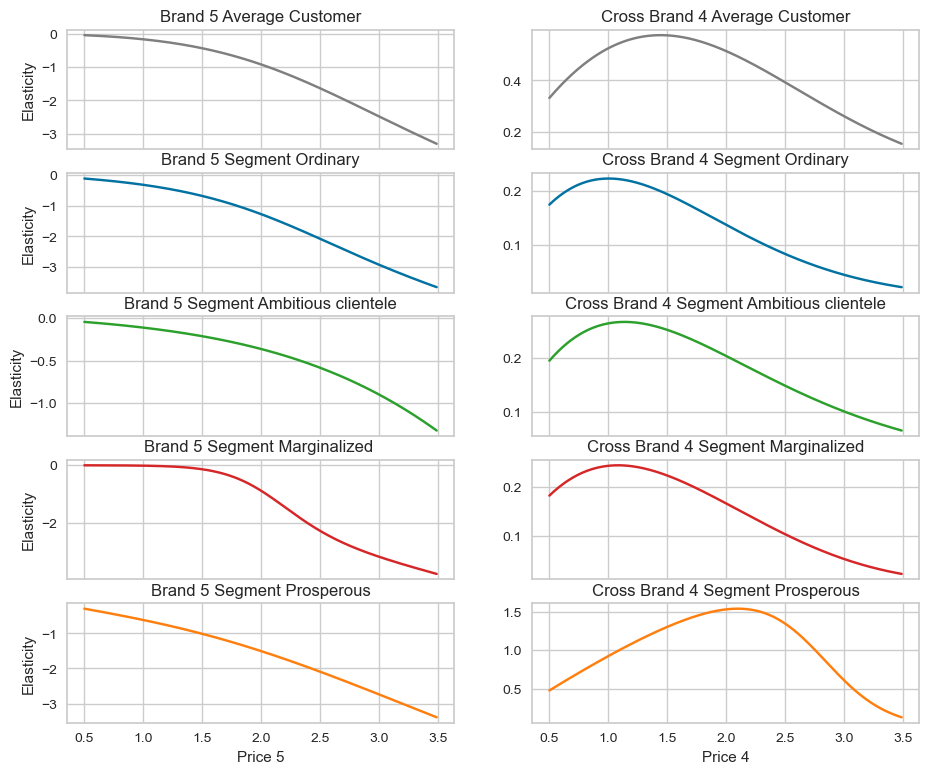

In [203]:
# We plot the own and cross brand price elasticities for the average customer and each of the four segments.
# We can observe differences and similiraties between the segments and examine their preference, when it comes to brand choice.
# The two segments, which seem to be of most interested for the marketing team of brand 5, seem to be the Ambitious clientele
# and the Prosperous segment. They are also the segments which purchase this brand most often. 
# The Ambitious clientele segment is the most inelastic and they are the most loyal segment. 
# Based on our model, they do not seem to be that affected by price, therefore brand 5 could increase its price, 
# without fear of significant loss of customers from this segment. 
# The Prosperous segment segment on the other hand, seems to be more elastic. They also purchase the competitor brand 4 most often.
# In order to target this segment, our analysis signals, that price needs to be decreased. However, keep in mind 
# that other factors aside from price might be influencing the purchase behaivour of this segment.
fig1, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 2, figsize = (11, 9), sharex = True)
ax1[0].plot(price_range, own_price_elasticity_brand_5, 'tab:grey')
ax1[0].set_title('Brand 5 Average Customer')
ax1[0].set_ylabel('Elasticity')
ax1[1].plot(price_range, brand5_cross_brand4_price_elasticity, 'tab:grey')
ax1[1].set_title('Cross Brand 4 Average Customer')


ax2[0].plot(price_range, own_price_elasticity_brand_5_s0)
ax2[0].set_title('Brand 5 Segment Ordinary')
ax2[0].set_ylabel('Elasticity')
ax2[1].plot(price_range, brand5_cross_brand4_price_elasticity_s0)
ax2[1].set_title('Cross Brand 4 Segment Ordinary')

ax3[0].plot(price_range, own_price_elasticity_brand_5_s1, 'tab:green')
ax3[0].set_title('Brand 5 Segment Ambitious clientele')
ax3[0].set_ylabel('Elasticity')
ax3[1].plot(price_range, brand5_cross_brand4_price_elasticity_s1, 'tab:green')
ax3[1].set_title('Cross Brand 4 Segment Ambitious clientele')

ax4[0].plot(price_range, own_price_elasticity_brand_5_s2, 'tab:red')
ax4[0].set_title('Brand 5 Segment Marginalized ')
ax4[0].set_ylabel('Elasticity')
ax4[1].plot(price_range, brand5_cross_brand4_price_elasticity_s2, 'tab:red')
ax4[1].set_title('Cross Brand 4 Segment Marginalized')

ax5[0].plot(price_range, own_price_elasticity_brand_5_s3, 'tab:orange')
ax5[0].set_title('Brand 5 Segment Prosperous')
ax5[0].set_xlabel('Price 5')
ax5[0].set_ylabel('Elasticity')
ax5[1].plot(price_range, brand5_cross_brand4_price_elasticity_s3, 'tab:orange')
ax5[1].set_title('Cross Brand 4 Segment Prosperous')
ax5[1].set_xlabel('Price 4')

#### Price Elasticity of Purchase Quantity

In [204]:
# We want to determine price elasticity of purchase quantity, also known as price elasticity of demand.
# We are interested in purchase ocassion, where the purchased quantity is different from 0.
# Therefore, once again we filter our data to contain only shopping visits where the client has purchased at least one product.
df_purchase_quantity = df_pa[df_pa['Incidence'] == 1]
df_purchase_quantity.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,Price_5,Promotion_1,Promotion_2,Promotion_3,Promotion_4,Promotion_5,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,2.09,2.67,0,0,0,0,0,0,0,47,1,110866,1,0,2,0,0,1,0
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,2.12,2.62,1,0,0,0,1,0,0,47,1,110866,1,0,2,0,0,1,0
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,1.97,2.67,0,0,0,1,0,0,0,47,1,110866,1,0,2,0,0,1,0
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,2.16,2.68,1,1,0,0,0,0,0,47,1,110866,1,0,2,0,0,1,0
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,1.89,2.37,1,0,0,1,1,0,0,47,1,110866,1,0,2,0,0,1,0


In [205]:
# Create brand dummies, for each of the five brands.
df_purchase_quantity = pd.get_dummies(df_purchase_quantity, columns = ['Brand'], prefix = 'Brand', prefix_sep = '_')
# The descriptive analysis of the purchase quantitiy data frame, shows that quantity ranges from 1 to 15 
# and has an average value of 2.8, which means that more often than not our customers buy more than 1 chocolate candy bar.
df_purchase_quantity.describe()

,ID,Day,Incidence,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,Price_5,Promotion_1,Promotion_2,Promotion_3,Promotion_4,Promotion_5,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3,Brand_1,Brand_2,Brand_3,Brand_4,Brand_5
count,1.463800e+04,14638.000000,14638.0,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000
mean,2.000003e+08,359.607597,1.0,2.774559,1.535251,0.406955,1.384559,1.764717,2.006694,2.159658,2.654296,0.372455,0.349638,0.043858,0.128091,0.045430,0.357289,0.385162,40.346905,1.151045,126706.452043,0.845471,0.797513,1.581910,0.175229,0.299290,0.293824,0.231657,0.092226,0.310288,0.057453,0.199959,0.340074
std,1.423786e+02,205.346253,0.0,1.796736,2.060858,0.491283,0.090944,0.181667,0.046200,0.093253,0.097724,0.483475,0.476872,0.204787,0.334203,0.208252,0.479217,0.486650,12.346284,0.634625,39935.109358,0.633840,0.810358,1.028171,0.380176,0.457962,0.455528,0.421906,0.289354,0.462627,0.232714,0.399983,0.473750
min,2.000000e+08,1.000000,1.0,1.000000,0.000000,0.000000,1.100000,1.260000,1.870000,1.760000,2.110000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000,0.000000,38247.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000001e+08,175.000000,1.0,2.000000,0.000000,0.000000,1.340000,1.570000,1.970000,2.120000,2.630000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,31.000000,1.000000,102723.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.000003e+08,355.000000,1.0,2.000000,0.000000,0.000000,1.390000,1.880000,2.010000,2.180000,2.670000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.000000,1.000000,122895.000000,1.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2.000004e+08,532.000000,1.0,3.000000,4.000000,1.000000,1.470000,1.890000,2.060000,2.240000,2.700000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,49.000000,2.000000,147967.000000,1.000000,1.000000,2.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000
max,2.000005e+08,727.000000,1.0,15.000000,5.000000,1.000000,1.590000,1.900000,2.140000,2.260000,2.800000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,75.000000,3.000000,309364.000000,2.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [206]:
# Here we make a decission on which features to include in our model. We decide to include a Price and a Promotion feature.
df_purchase_quantity.columns.values

array(['ID', 'Day', 'Incidence', 'Quantity', 'Last_Inc_Brand',
       'Last_Inc_Quantity', 'Price_1', 'Price_2', 'Price_3', 'Price_4',
       'Price_5', 'Promotion_1', 'Promotion_2', 'Promotion_3',
       'Promotion_4', 'Promotion_5', 'Sex', 'Marital status', 'Age',
       'Education', 'Income', 'Occupation', 'Settlement size', 'Segment',
       'Segment_0', 'Segment_1', 'Segment_2', 'Segment_3', 'Brand_1',
       'Brand_2', 'Brand_3', 'Brand_4', 'Brand_5'], dtype=object)

In [207]:
#Find the price of the product that is chosen at this incidence
df_purchase_quantity['Price_Incidence'] = (df_purchase_quantity['Brand_1'] * df_purchase_quantity['Price_1'] +
                                           df_purchase_quantity['Brand_2'] * df_purchase_quantity['Price_2'] +
                                           df_purchase_quantity['Brand_3'] * df_purchase_quantity['Price_3'] +
                                           df_purchase_quantity['Brand_4'] * df_purchase_quantity['Price_4'] +
                                           df_purchase_quantity['Brand_5'] * df_purchase_quantity['Price_5'] )

In [208]:
#Find the price of the product that is chosen at this incidence
df_purchase_quantity['Promotion_Incidence'] = (df_purchase_quantity['Brand_1'] * df_purchase_quantity['Promotion_1'] +
                                               df_purchase_quantity['Brand_2'] * df_purchase_quantity['Promotion_2'] +
                                               df_purchase_quantity['Brand_3'] * df_purchase_quantity['Promotion_3'] +
                                               df_purchase_quantity['Brand_4'] * df_purchase_quantity['Promotion_4'] +
                                               df_purchase_quantity['Brand_5'] * df_purchase_quantity['Promotion_5'] )

#### Model Estimation - Linear Regression

In [209]:
X = df_purchase_quantity[['Price_Incidence', 'Promotion_Incidence']]
pd.options.display.max_rows = 100
X

,Price_Incidence,Promotion_Incidence
6,1.90,0
11,2.62,1
19,1.47,0
24,2.16,0
29,1.88,0
...,...,...
58621,1.89,0
58648,1.35,1
58674,1.85,1
58687,1.51,0


In [210]:
Y = df_purchase_quantity['Quantity']
Y.head()

6     2
11    1
19    2
24    1
29    3
Name: Quantity, dtype: int64

In [211]:
# Linear Regression Model
model_quantity = LinearRegression()
model_quantity.fit(X, Y)

LinearRegression()

In [212]:
# Linear Regression Model. The coefficients for price and promotion are both negative. 
# It appears that promotion reflects negatively on the purchase quantity of the average client, which is unexpected.
model_quantity.coef_

array([-0.8173651 , -0.10504673])

#### Price Elasticity with Promotion

In [213]:
# We examine the price elasticity of purchase quantity with active promotional activities for each price point.
df_price_elasticity_quantity = pd.DataFrame(index = np.arange(price_range.size))
df_price_elasticity_quantity['Price_Incidence'] = price_range
df_price_elasticity_quantity['Promotion_Incidence'] = 1

In [214]:
#Take the coefficient for price.
beta_quantity = model_quantity.coef_[0]
beta_quantity

-0.8173651016684998

In [215]:
predict_quantity = model_quantity.predict(df_price_elasticity_quantity)

In [216]:
# We calculate the price elasticity with our new formula. It is the beta coefficient for price multiplied by price
# and divided by the purchase quantity.
price_elasticity_quantity_promotion_yes = beta_quantity * price_range / predict_quantity

In [217]:
df_price_elasticities['PE_Quantity_Promotion_1'] = price_elasticity_quantity_promotion_yes
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_0,PE_Segment_1,PE_Segment_2,PE_Segment_3,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2,Brand 5 S3,Brand_5_Cross_Brand_4_S3,PE_Quantity_Promotion_1
0,0.50,-0.096453,-0.211181,-0.119076,-0.030920,-0.010587,-0.125745,-0.195653,-0.049055,0.332011,-0.115819,0.174104,-0.043940,0.194769,-0.001036,0.181593,-0.297341,0.482421,-0.102157
1,0.51,-0.100525,-0.217751,-0.123258,-0.032687,-0.011192,-0.129861,-0.201775,-0.050616,0.337287,-0.118858,0.176159,-0.045027,0.197253,-0.001098,0.183890,-0.303387,0.491726,-0.104413
2,0.52,-0.104724,-0.224429,-0.127534,-0.034540,-0.011827,-0.134057,-0.207999,-0.052206,0.342507,-0.121932,0.178163,-0.046123,0.199686,-0.001163,0.186138,-0.309443,0.501016,-0.106679
3,0.53,-0.109053,-0.231216,-0.131905,-0.036485,-0.012493,-0.138332,-0.214326,-0.053827,0.347669,-0.125040,0.180117,-0.047228,0.202068,-0.001231,0.188337,-0.315511,0.510290,-0.108954
4,0.54,-0.113515,-0.238112,-0.136372,-0.038524,-0.013191,-0.142688,-0.220758,-0.055477,0.352773,-0.128185,0.182020,-0.048343,0.204400,-0.001303,0.190488,-0.321589,0.519548,-0.111238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,3.45,-8.017889,-5.051815,-5.680542,-12.541039,-4.294222,-4.861635,-4.983227,-3.231571,0.162235,-3.592461,0.024055,-1.287419,0.068595,-3.746081,0.023406,-3.337316,0.157506,-1.774292
296,3.46,-8.043148,-5.068671,-5.700698,-12.577954,-4.306862,-4.879836,-5.000133,-3.247765,0.160335,-3.606365,0.023699,-1.297228,0.067972,-3.757523,0.022947,-3.350647,0.152084,-1.788634
297,3.47,-8.068372,-5.085509,-5.720818,-12.614852,-4.319496,-4.898007,-5.017019,-3.263927,0.158449,-3.620225,0.023347,-1.307092,0.067353,-3.768945,0.022494,-3.363974,0.146827,-1.803124
298,3.48,-8.093563,-5.102328,-5.740902,-12.651734,-4.332125,-4.916148,-5.033885,-3.280056,0.156578,-3.634042,0.023000,-1.317011,0.066739,-3.780347,0.022048,-3.377298,0.141731,-1.817766


Text(0.5, 1.0, 'Price Elasticity of Purchase Quantity with Promotion')

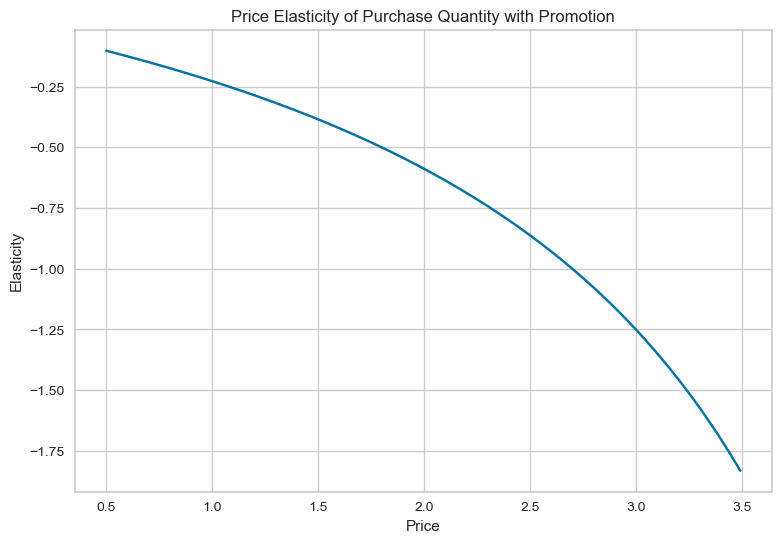

In [218]:
plt.figure(figsize = (9, 6))
plt.plot(price_range, price_elasticity_quantity_promotion_yes)
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Quantity with Promotion')

#### Price Elasticity without Promotion

In [219]:
# Overwrite promotion incidence in order to use the same df. 
# Here we assume there are no promotinal activities active for the entire price range.
df_price_elasticity_quantity['Promotion_Incidence'] = 0
# Find the new predicted quantities.
predict_quantity = model_quantity.predict(df_price_elasticity_quantity)
# Calculate the new price elasticities.
price_elasticity_quantity_promotion_no = beta_quantity * price_range / predict_quantity
# Add the results to the master data frame.
df_price_elasticities['PE_Quantity_Promotion_0'] = price_elasticity_quantity_promotion_no
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_0,PE_Segment_1,PE_Segment_2,PE_Segment_3,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2,Brand 5 S3,Brand_5_Cross_Brand_4_S3,PE_Quantity_Promotion_1,PE_Quantity_Promotion_0
0,0.50,-0.096453,-0.211181,-0.119076,-0.030920,-0.010587,-0.125745,-0.195653,-0.049055,0.332011,-0.115819,0.174104,-0.043940,0.194769,-0.001036,0.181593,-0.297341,0.482421,-0.102157,-0.099543
1,0.51,-0.100525,-0.217751,-0.123258,-0.032687,-0.011192,-0.129861,-0.201775,-0.050616,0.337287,-0.118858,0.176159,-0.045027,0.197253,-0.001098,0.183890,-0.303387,0.491726,-0.104413,-0.101736
2,0.52,-0.104724,-0.224429,-0.127534,-0.034540,-0.011827,-0.134057,-0.207999,-0.052206,0.342507,-0.121932,0.178163,-0.046123,0.199686,-0.001163,0.186138,-0.309443,0.501016,-0.106679,-0.103939
3,0.53,-0.109053,-0.231216,-0.131905,-0.036485,-0.012493,-0.138332,-0.214326,-0.053827,0.347669,-0.125040,0.180117,-0.047228,0.202068,-0.001231,0.188337,-0.315511,0.510290,-0.108954,-0.106150
4,0.54,-0.113515,-0.238112,-0.136372,-0.038524,-0.013191,-0.142688,-0.220758,-0.055477,0.352773,-0.128185,0.182020,-0.048343,0.204400,-0.001303,0.190488,-0.321589,0.519548,-0.111238,-0.108369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,3.45,-8.017889,-5.051815,-5.680542,-12.541039,-4.294222,-4.861635,-4.983227,-3.231571,0.162235,-3.592461,0.024055,-1.287419,0.068595,-3.746081,0.023406,-3.337316,0.157506,-1.774292,-1.664290
296,3.46,-8.043148,-5.068671,-5.700698,-12.577954,-4.306862,-4.879836,-5.000133,-3.247765,0.160335,-3.606365,0.023699,-1.297228,0.067972,-3.757523,0.022947,-3.350647,0.152084,-1.788634,-1.677205
297,3.47,-8.068372,-5.085509,-5.720818,-12.614852,-4.319496,-4.898007,-5.017019,-3.263927,0.158449,-3.620225,0.023347,-1.307092,0.067353,-3.768945,0.022494,-3.363974,0.146827,-1.803124,-1.690246
298,3.48,-8.093563,-5.102328,-5.740902,-12.651734,-4.332125,-4.916148,-5.033885,-3.280056,0.156578,-3.634042,0.023000,-1.317011,0.066739,-3.780347,0.022048,-3.377298,0.141731,-1.817766,-1.703414


Text(0.5, 1.0, 'Price Elasticity of Purchase Quantity with Promotion')

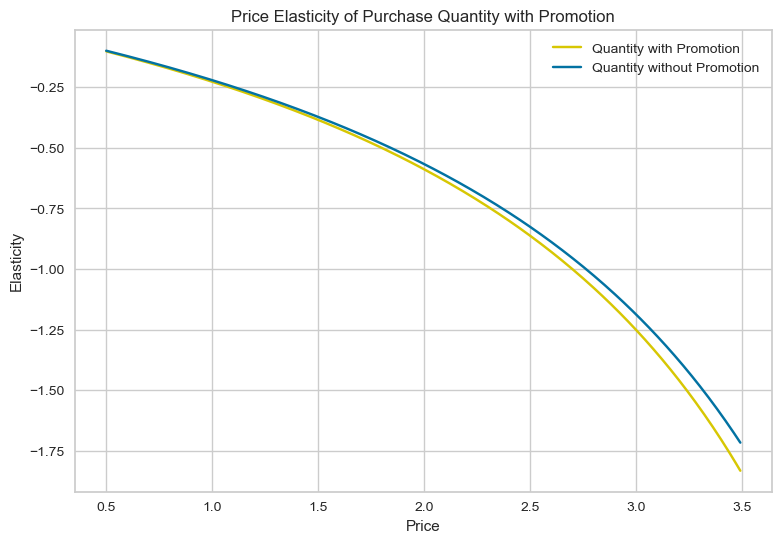

In [226]:
# Plot the two elasticities side by side. 
# We observe that the two elasticities are very close together for almost the entire price range.
# It appears that promotion does not appear to be a significant factor in the customers' decission 
# what quantity of chocolate candy bars to purchase.
plt.figure(figsize = (9, 6))
plt.plot(price_range, price_elasticity_quantity_promotion_yes, color = 'y', label = 'Quantity with Promotion')
plt.plot(price_range, price_elasticity_quantity_promotion_no, color = 'b', label = 'Quantity without Promotion')
plt.legend()
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Quantity with Promotion')